<h2>
<font color = 'red'>Note</font>: To start working<br><br>
<font color = 'gold'>In Colab</font>: upload the "video_03m" file <br> to the directory in which the "sample_data" folder lies <br><br>  
<font color = 'gold'>On a local machine</font>: upload the "video_03m" file <br> to the directory this Jupyter Notebook is in
<h2>

<h3> Configuring the tools </h3>

In [25]:
'''
pip install gdown
import gdown
url = 'https://docs.google.com/spreadsheets/d/1WnIVh-a_I1x8qn-OrTkWy19_IYeX72Sn/edit?usp=sharing&ouid=117051964108713390699&rtpof=true&sd=true'
output = 'video_03m.xlsm'

gdown.download(url, output, quiet=False)
'''
# Manually add the file following the instructions in the beginning

import numpy as np
import matplotlib as mpl
from matplotlib import rc
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.animation import FuncAnimation

file_path = 'video_03m.xlsm'
xlsm = pd.read_excel(file_path, sheet_name=None)

#for sheet_name, df in xlsm.items():
    #print(f"Sheet Name: {sheet_name}")
    #print(df)  # Display the DataFrame for each sheet

rc('animation', html='jshtml')
mpl.rcParams['animation.embed_limit'] = 2**128
plt.style.use('dark_background')
plt.rcParams['axes.edgecolor'] = 'black'

C:\Users\User\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\openpyxl\worksheet\_reader.py:329: UserWarning: Web Extension extension is not supported and will be removed
  warn(msg)


In [26]:
print(xlsm['video_03'].columns)
df = xlsm['video_03']
x_df = df.filter(regex='x_')
y_df = df.filter(regex='y_')
c_df = df.filter(regex='c_')

Index(['x_09', 'y_09', 'c_09', 'x_10', 'y_10', 'c_10', 'x_11', 'y_11', 'c_11',
       'x_12', 'y_12', 'c_12', 'x_13', 'y_13', 'c_13', 'x_14', 'y_14', 'c_14',
       'frame_id', 'h_angle', 'l_knee_angle', 'r_knee_angle', 'd9-12', 'd9-10',
       'd10-11', 'd12-13', 'd13-14', 'Unnamed: 27', 'Unnamed: 28',
       'Unnamed: 29', 'Unnamed: 30', 'Unnamed: 31', 'Unnamed: 32',
       'Unnamed: 33'],
      dtype='object')


<h3> First set of columns in <font color='red'>"оп2"</font> sheet </h3>

In [8]:
df2 = xlsm['оп2']
x_df2 = -df2.filter(regex='x_')
y_df2 = -df2.filter(regex='y_')
c_df2 = -df2.filter(regex='c_')
xdfcp = x_df2.iloc[:, 0:25]
ydfcp = y_df2.iloc[:, 0:25]

In [9]:
#print(xlsm['оп2'].columns)
#x_df2.iloc[:, 0:25]

# SEE FRAMES 150 - 180 TO DETECT CHANGE IN LEFT-RIGHT
### BLUE FOR RIGHT, RED FOR LEFT

In [10]:
# SEE FRAMES 150 - 180 TO DETECT CHANGE IN LEFT-RIGHT
### BLUE FOR RIGHT, RED FOR LEFT

In [11]:
fps = 30  # set manually
resolution_x, resolution_y = 720, 1280  # set manually
frames_range = range(500, 560)  # what frames to show
fix_limits = True

hardlim = resolution_x // 2  # limit axes (set manually)
offset = -resolution_x // 2  # center of the picture offset (set manually)


ratio = resolution_x / resolution_y

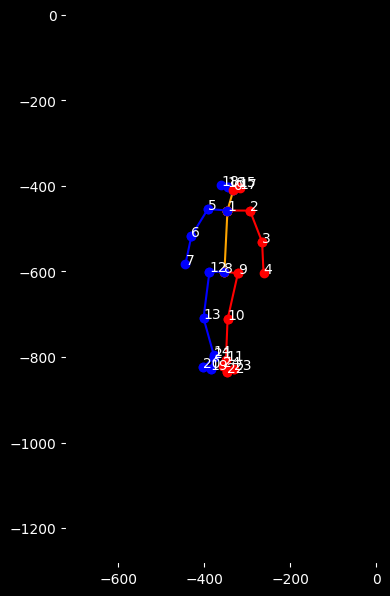

In [12]:
#@title Show code
size = 4
fig, ax = plt.subplots(figsize=(size * ratio, size) if ratio > 1 else (size, size * 1 / ratio))
# scatter = ax.scatter([], [], color='orange')
# ax.set_xlim(xdfcp.dropna().values.min() - 1, xdfcp.dropna().values.max() + 1)
# ax.set_ylim(ydfcp.dropna().values.min() - 1, ydfcp.dropna().values.max() + 1)
ax.set_xlim(-hardlim + offset, hardlim + offset)
ax.set_ylim((-hardlim + offset) / ratio, (hardlim + offset) / ratio)

prev_annotations = []
lines = []
def update(frame):

    global lines
    global prev_annotations
    for line in lines:
        line.remove()

    if not fix_limits:
        ax.set_xlim(np.nanmin(xdfcp.iloc[frame].values) - 20, np.nanmax(xdfcp.iloc[frame].values) + 20)
        ax.set_ylim(np.nanmin(ydfcp.iloc[frame].values) - 20, np.nanmax(ydfcp.iloc[frame].values) + 20)

    # left arm
    lines = []
    # for i in range(2, 5):
    for i in range(3, 5):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)

    # right arm
    '''
    prev_x = xdfcp.iloc[frame, 1]
    prev_y = ydfcp.iloc[frame, 1]
    x = xdfcp.iloc[frame, 5]
    y = ydfcp.iloc[frame, 5]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
    lines.append(line)
    '''
    for i in range(6, 8):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)

    # head
    prev_x = xdfcp.iloc[frame, 0]
    prev_y = ydfcp.iloc[frame, 0]
    x = xdfcp.iloc[frame, 1]
    y = ydfcp.iloc[frame, 1]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='orange')
    lines.append(line)

    # spine
    prev_x = xdfcp.iloc[frame, 1]
    prev_y = ydfcp.iloc[frame, 1]
    x = xdfcp.iloc[frame, 8]
    y = ydfcp.iloc[frame, 8]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='orange')
    lines.append(line)

    # pelvis -> left hip
    prev_x = xdfcp.iloc[frame, 8]
    prev_y = ydfcp.iloc[frame, 8]
    x = xdfcp.iloc[frame, 9]
    y = ydfcp.iloc[frame, 9]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
    lines.append(line)

    # pelvis -> right hip
    prev_x = xdfcp.iloc[frame, 8]
    prev_y = ydfcp.iloc[frame, 8]
    x = xdfcp.iloc[frame, 12]
    y = ydfcp.iloc[frame, 12]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
    lines.append(line)

    # left leg
    for i in range(10, 12):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)

    # right leg
    for i in range(13, 15):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)

    # right foot
    prev_x = xdfcp.iloc[frame, 19]
    prev_y = ydfcp.iloc[frame, 19]
    x = xdfcp.iloc[frame, 21]
    y = ydfcp.iloc[frame, 21]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
    lines.append(line)
    for i in range(20, 22):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)

    # left foot
    prev_x = xdfcp.iloc[frame, 22]
    prev_y = ydfcp.iloc[frame, 22]
    x = xdfcp.iloc[frame, 24]
    y = ydfcp.iloc[frame, 24]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
    lines.append(line)
    for i in range(23, 25):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)

    # left shoulder
    prev_x = xdfcp.iloc[frame, 1]
    prev_y = ydfcp.iloc[frame, 1]
    x = xdfcp.iloc[frame, 2]
    y = ydfcp.iloc[frame, 2]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
    lines.append(line)

    # right shoulder
    prev_x = xdfcp.iloc[frame, 1]
    prev_y = ydfcp.iloc[frame, 1]
    x = xdfcp.iloc[frame, 5]
    y = ydfcp.iloc[frame, 5]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
    lines.append(line)

    # face right
    for i, j in [(0, 16), (16, 18)]:
        prev_x = xdfcp.iloc[frame, i]
        prev_y = ydfcp.iloc[frame, i]
        x = xdfcp.iloc[frame, j]
        y = ydfcp.iloc[frame, j]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)

    # face left
    for i, j in [(0, 15), (15, 17)]:
        prev_x = xdfcp.iloc[frame, i]
        prev_y = ydfcp.iloc[frame, i]
        x = xdfcp.iloc[frame, j]
        y = ydfcp.iloc[frame, j]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)

    for annotation in prev_annotations:
        annotation.remove()
    prev_annotations = annotate_points(xdfcp.iloc[frame], ydfcp.iloc[frame])
    return lines

def annotate_points(x_data, y_data):
    annotations = []
    for i, (x, y) in enumerate(zip(x_data, y_data)):
        annotation = ax.annotate(str(i), (x, y), color='white')
        annotations.append(annotation)
    return annotations

# Create the animation
# limit_frames = len(x_df)
limit_frames = 10
ani = FuncAnimation(fig, update, frames=frames_range, interval=1000 / fps)
#plt.grid(True, color='dimgray')

In [14]:
ani

<h3> Second set of columns in <font color='red'>"оп2"</font> </h3>

In [38]:
xdfcp = x_df2.iloc[:, 25:]
ydfcp = y_df2.iloc[:, 25:]

In [39]:
fps = 30  # set manually
resolution_x, resolution_y = 720, 1280  # set manually
frames_range = range(500, 570)  # what frames to show
fix_limits = False

hardlim = resolution_x // 2  # limit axes (set manually)
offset = -resolution_x // 2  # center of the picture offset (set manually)


ratio = resolution_x / resolution_y

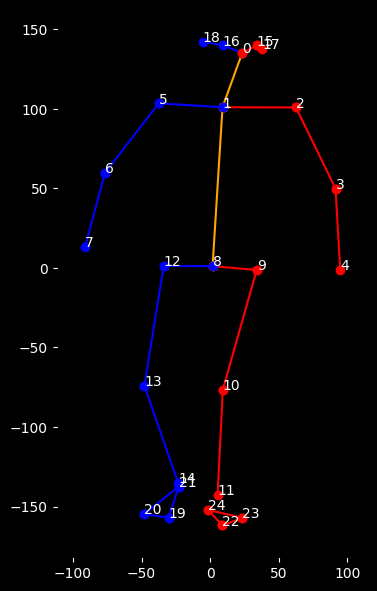

In [40]:
#@title Show code
size = 4
fig, ax = plt.subplots(figsize=(size * ratio, size) if ratio > 1 else (size, size * 1 / ratio))
# scatter = ax.scatter([], [], color='orange')
# ax.set_xlim(xdfcp.dropna().values.min() - 1, xdfcp.dropna().values.max() + 1)
# ax.set_ylim(ydfcp.dropna().values.min() - 1, ydfcp.dropna().values.max() + 1)
ax.set_xlim(-hardlim + offset, hardlim + offset)
ax.set_ylim((-hardlim + offset) / ratio, (hardlim + offset) / ratio)

prev_annotations = []
lines = []
def update(frame):

    global lines
    global prev_annotations
    for line in lines:
        line.remove()

    if not fix_limits:
        ax.set_xlim(np.nanmin(xdfcp.iloc[frame].values) - 20, np.nanmax(xdfcp.iloc[frame].values) + 20)
        ax.set_ylim(np.nanmin(ydfcp.iloc[frame].values) - 20, np.nanmax(ydfcp.iloc[frame].values) + 20)

    # left arm
    lines = []
    # for i in range(2, 5):
    for i in range(3, 5):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)

    # right arm
    '''
    prev_x = xdfcp.iloc[frame, 1]
    prev_y = ydfcp.iloc[frame, 1]
    x = xdfcp.iloc[frame, 5]
    y = ydfcp.iloc[frame, 5]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
    lines.append(line)
    '''
    for i in range(6, 8):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)

    # head
    prev_x = xdfcp.iloc[frame, 0]
    prev_y = ydfcp.iloc[frame, 0]
    x = xdfcp.iloc[frame, 1]
    y = ydfcp.iloc[frame, 1]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='orange')
    lines.append(line)

    # spine
    prev_x = xdfcp.iloc[frame, 1]
    prev_y = ydfcp.iloc[frame, 1]
    x = xdfcp.iloc[frame, 8]
    y = ydfcp.iloc[frame, 8]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='orange')
    lines.append(line)

    # pelvis -> left hip
    prev_x = xdfcp.iloc[frame, 8]
    prev_y = ydfcp.iloc[frame, 8]
    x = xdfcp.iloc[frame, 9]
    y = ydfcp.iloc[frame, 9]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
    lines.append(line)

    # pelvis -> right hip
    prev_x = xdfcp.iloc[frame, 8]
    prev_y = ydfcp.iloc[frame, 8]
    x = xdfcp.iloc[frame, 12]
    y = ydfcp.iloc[frame, 12]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
    lines.append(line)

    # left leg
    for i in range(10, 12):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)

    # right leg
    for i in range(13, 15):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)

    # right foot
    prev_x = xdfcp.iloc[frame, 19]
    prev_y = ydfcp.iloc[frame, 19]
    x = xdfcp.iloc[frame, 21]
    y = ydfcp.iloc[frame, 21]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
    lines.append(line)
    for i in range(20, 22):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)

    # left foot
    prev_x = xdfcp.iloc[frame, 22]
    prev_y = ydfcp.iloc[frame, 22]
    x = xdfcp.iloc[frame, 24]
    y = ydfcp.iloc[frame, 24]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
    lines.append(line)
    for i in range(23, 25):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)

    # left shoulder
    prev_x = xdfcp.iloc[frame, 1]
    prev_y = ydfcp.iloc[frame, 1]
    x = xdfcp.iloc[frame, 2]
    y = ydfcp.iloc[frame, 2]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
    lines.append(line)

    # right shoulder
    prev_x = xdfcp.iloc[frame, 1]
    prev_y = ydfcp.iloc[frame, 1]
    x = xdfcp.iloc[frame, 5]
    y = ydfcp.iloc[frame, 5]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
    lines.append(line)

    # face right
    for i, j in [(0, 16), (16, 18)]:
        prev_x = xdfcp.iloc[frame, i]
        prev_y = ydfcp.iloc[frame, i]
        x = xdfcp.iloc[frame, j]
        y = ydfcp.iloc[frame, j]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)

    # face left
    for i, j in [(0, 15), (15, 17)]:
        prev_x = xdfcp.iloc[frame, i]
        prev_y = ydfcp.iloc[frame, i]
        x = xdfcp.iloc[frame, j]
        y = ydfcp.iloc[frame, j]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)

    for annotation in prev_annotations:
        annotation.remove()
    prev_annotations = annotate_points(xdfcp.iloc[frame], ydfcp.iloc[frame])
    return lines

def annotate_points(x_data, y_data):
    annotations = []
    for i, (x, y) in enumerate(zip(x_data, y_data)):
        annotation = ax.annotate(str(i), (x, y), color='white')
        annotations.append(annotation)
    return annotations

# Create the animation
# limit_frames = len(x_df)
limit_frames = 10
ani = FuncAnimation(fig, update, frames=frames_range, interval=1000 / fps)
#plt.grid(True, color='dimgray')

In [41]:
ani

<h3> Let's get to another one </h3>
<font color='red'>"один проход"</font> data


In [44]:
df3 = pd.read_excel(file_path, sheet_name='один проход')

In [45]:
x_df3 = -df3.filter(regex='x_')
y_df3 = -df3.filter(regex='y_')
c_df3 = -df3.filter(regex='c_')

In [46]:
xdfcp = x_df3.iloc[:, 0:25]
ydfcp = y_df3.iloc[:, 0:25]

In [47]:
fps = 30  # set manually
resolution_x, resolution_y = 720, 1280  # set manually
frames_range = range(500, 570)  # what frames to show
fix_limits = True

hardlim = resolution_x // 2  # limit axes (set manually [if fix_limits==True])
offset = -resolution_x // 2  # center of the picture offset (set manually [if fix_limits==True])


ratio = resolution_x / resolution_y

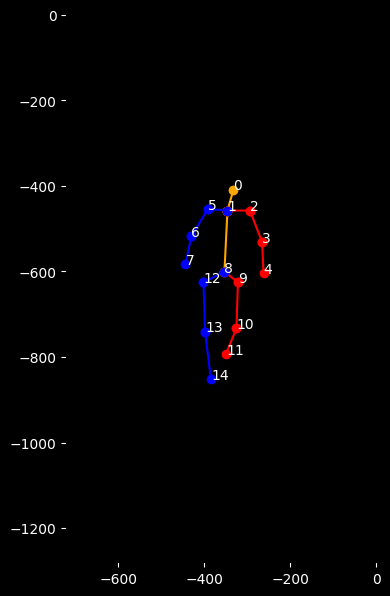

In [48]:
#@title Show code
size = 4
fig, ax = plt.subplots(figsize=(size * ratio, size) if ratio > 1 else (size, size * 1 / ratio))
# scatter = ax.scatter([], [], color='orange')
# ax.set_xlim(xdfcp.dropna().values.min() - 1, xdfcp.dropna().values.max() + 1)
# ax.set_ylim(ydfcp.dropna().values.min() - 1, ydfcp.dropna().values.max() + 1)
ax.set_xlim(-hardlim + offset, hardlim + offset)
ax.set_ylim((-hardlim + offset) / ratio, (hardlim + offset) / ratio)

prev_annotations = []
lines = []
def update(frame):

    global lines
    global prev_annotations
    for line in lines:
        line.remove()

    if not fix_limits:
        ax.set_xlim(np.nanmin(xdfcp.iloc[frame].values) - 20, np.nanmax(xdfcp.iloc[frame].values) + 20)
        ax.set_ylim(np.nanmin(ydfcp.iloc[frame].values) - 20, np.nanmax(ydfcp.iloc[frame].values) + 20)

    # left arm
    lines = []
    # for i in range(2, 5):
    for i in range(3, 5):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)

    # right arm
    '''
    prev_x = xdfcp.iloc[frame, 1]
    prev_y = ydfcp.iloc[frame, 1]
    x = xdfcp.iloc[frame, 5]
    y = ydfcp.iloc[frame, 5]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
    lines.append(line)
    '''
    for i in range(6, 8):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)

    # head
    prev_x = xdfcp.iloc[frame, 0]
    prev_y = ydfcp.iloc[frame, 0]
    x = xdfcp.iloc[frame, 1]
    y = ydfcp.iloc[frame, 1]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='orange')
    lines.append(line)

    # spine
    prev_x = xdfcp.iloc[frame, 1]
    prev_y = ydfcp.iloc[frame, 1]
    x = xdfcp.iloc[frame, 8]
    y = ydfcp.iloc[frame, 8]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='orange')
    lines.append(line)

    # pelvis -> left hip
    prev_x = xdfcp.iloc[frame, 8]
    prev_y = ydfcp.iloc[frame, 8]
    x = xdfcp.iloc[frame, 9]
    y = ydfcp.iloc[frame, 9]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
    lines.append(line)

    # pelvis -> right hip
    prev_x = xdfcp.iloc[frame, 8]
    prev_y = ydfcp.iloc[frame, 8]
    x = xdfcp.iloc[frame, 12]
    y = ydfcp.iloc[frame, 12]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
    lines.append(line)

    # left leg
    for i in range(10, 12):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)

    # right leg
    for i in range(13, 15):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)
    '''
    # right foot
    prev_x = xdfcp.iloc[frame, 19]
    prev_y = ydfcp.iloc[frame, 19]
    x = xdfcp.iloc[frame, 21]
    y = ydfcp.iloc[frame, 21]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
    lines.append(line)
    for i in range(20, 22):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)

    # left foot
    prev_x = xdfcp.iloc[frame, 22]
    prev_y = ydfcp.iloc[frame, 22]
    x = xdfcp.iloc[frame, 24]
    y = ydfcp.iloc[frame, 24]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
    lines.append(line)
    for i in range(23, 25):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)
    '''
    # left shoulder
    prev_x = xdfcp.iloc[frame, 1]
    prev_y = ydfcp.iloc[frame, 1]
    x = xdfcp.iloc[frame, 2]
    y = ydfcp.iloc[frame, 2]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
    lines.append(line)

    # right shoulder
    prev_x = xdfcp.iloc[frame, 1]
    prev_y = ydfcp.iloc[frame, 1]
    x = xdfcp.iloc[frame, 5]
    y = ydfcp.iloc[frame, 5]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
    lines.append(line)
    '''
    # face right
    for i, j in [(0, 16), (16, 18)]:
        prev_x = xdfcp.iloc[frame, i]
        prev_y = ydfcp.iloc[frame, i]
        x = xdfcp.iloc[frame, j]
        y = ydfcp.iloc[frame, j]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)

    # face left
    for i, j in [(0, 15), (15, 17)]:
        prev_x = xdfcp.iloc[frame, i]
        prev_y = ydfcp.iloc[frame, i]
        x = xdfcp.iloc[frame, j]
        y = ydfcp.iloc[frame, j]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)
    '''
    for annotation in prev_annotations:
        annotation.remove()
    prev_annotations = annotate_points(xdfcp.iloc[frame], ydfcp.iloc[frame])
    return lines

def annotate_points(x_data, y_data):
    annotations = []
    for i, (x, y) in enumerate(zip(x_data, y_data)):
        annotation = ax.annotate(str(i), (x, y), color='white')
        annotations.append(annotation)
    return annotations

# Create the animation
# limit_frames = len(x_df)
limit_frames = 10
ani = FuncAnimation(fig, update, frames=frames_range, interval=1000 / fps)
#plt.grid(True, color='dimgray')

In [112]:
ani

<h1> Let's get to the angles and distances <h1>

<h2> <font color='red'>"один проход"</font> distances and angles </h2>

<font color='cyan'>Distances:</font>

<h4> We're interested in the distances between the following points ("один проход"): <br>
8-12 <br>
8-9 <br>
9-10 <br>
10-11 <br>
12-13 <br>
13-14 <br>
See the image below for reference <br>
(Note: subject walking <font color='lime'>towards</font> the camera in the picture. <br> In the video the subject walks towards the camera)
</h4>
<img src="https://raw.githubusercontent.com/oscar-foxtrot/Coxarthrosis-research/main/images/points_one_pass.png">

<h3> Plots </h3>

In [95]:
points_of_interest = [] # SET MANUALLY by uncommenting the rows or appending manually
#points_of_interest.extend([(12, 13), (13, 14)])  # right leg
#points_of_interest.extend([(9, 10), (10, 11)])  # left leg
#points_of_interest.extend([(8, 12), (8, 9)])  # pelvis

points_of_interest.extend([(10, 11), (13, 14), (11, 14)])

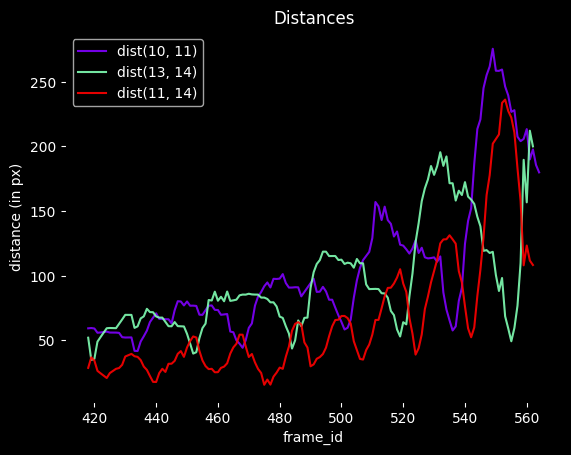

In [96]:
#@title Show code
fig, ax = plt.subplots()
ax.set_xlabel('frame_id')
ax.set_ylabel('distance (in px)')
ax.set_title('Distances')
colors = mpl.cm.rainbow(np.linspace(0, 1, len(points_of_interest)))

df3cp = df3.copy() # Part of data lost (no frame_id provided for the last dozen rows)
df3cp = df3cp.reindex(df3['frame_id'].dropna().astype(int))
x_df3 = -df3cp.filter(regex='x_')
y_df3 = -df3cp.filter(regex='y_')
c_df3 = -df3cp.filter(regex='c_')
xdfcp = x_df3.iloc[:, 0:25]
ydfcp = y_df3.iloc[:, 0:25]

counter = 0
for p0, p1 in points_of_interest:
    # Convert into string format
    p0 = f'0{p0}' if p0 < 10 else f'{p0}'
    p1 = f'0{p1}' if p1 < 10 else f'{p1}'

    dists = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
        + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)

    ax.plot(df3cp.index, dists, color=colors[counter], label=f'dist({p0}, {p1})', alpha=0.9)
    counter += 1

ax.legend()
plt.show()

<font color='cyan'>Angles:</font>

In [97]:
# Represent a joint as follows:
# [(point_0, point_1), (point_2, point_3)]
# Example: [(9, 10), (10, 11)] - left knee

In [98]:
joints_of_interest = [] # SET MANUALLY by uncommenting the rows or appending manually
#joints_of_interest.append([(9, 10), (10, 11)])  # left knee
joints_of_interest.append([(12, 13), (13, 14)])  # right knee
joints_of_interest.append([(8, 12), (9, 8)])  # pelvis
joints_of_interest.append([(8, 12), (8, 9)])  # pelvis: order of the points in the vector changed

#joints_of_interest.append()

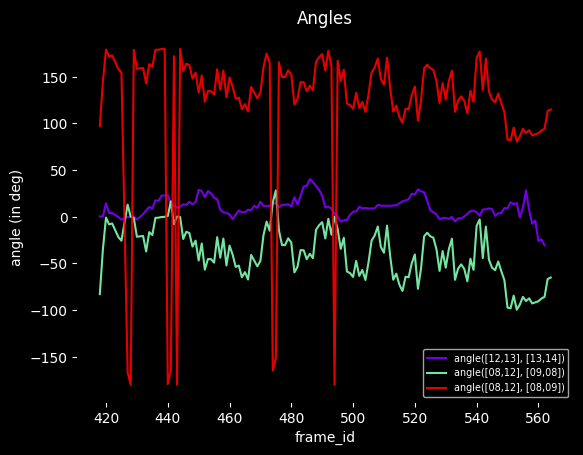

In [99]:
#@title Show code
fig, ax = plt.subplots()
ax.set_xlabel('frame_id')
ax.set_ylabel('angle (in deg)')
ax.set_title('Angles')
colors = mpl.cm.rainbow(np.linspace(0, 1, len(joints_of_interest)))

df3cp = df3.copy() # Part of data lost (no frame_id provided for the last dozen rows)
df3cp = df3cp.reindex(df3['frame_id'].dropna().astype(int))
x_df3 = -df3cp.filter(regex='x_')
y_df3 = -df3cp.filter(regex='y_')
c_df3 = -df3cp.filter(regex='c_')
xdfcp = x_df3.iloc[:, 0:25]
ydfcp = y_df3.iloc[:, 0:25]

counter = 0
for (p0, p1), (p2, p3) in joints_of_interest:
    # Convert into string format
    p0 = f'0{p0}' if p0 < 10 else f'{p0}'
    p1 = f'0{p1}' if p1 < 10 else f'{p1}'
    p2 = f'0{p2}' if p2 < 10 else f'{p2}'
    p3 = f'0{p3}' if p3 < 10 else f'{p3}'

#### STABLE VERSION ###############
    vects1 = np.array((xdfcp[f'x_{p1}'] - xdfcp[f'x_{p0}'], ydfcp[f'y_{p1}'] - ydfcp[f'y_{p0}']))
    vects2 = np.array((xdfcp[f'x_{p3}'] - xdfcp[f'x_{p2}'], ydfcp[f'y_{p3}'] - ydfcp[f'y_{p2}']))
    dot_prod = np.sum(vects1 * vects2, axis=0)
    cross_prod = np.cross(
        vects1,
        vects2,
        axisa=0,
        axisb=0,
        axis=0
    )

    sine = cross_prod / (np.linalg.norm(vects1, axis=0) * np.linalg.norm(vects2, axis=0))
    angles_rad = np.where(
        np.abs(sine) <= 0.5,
        np.where(dot_prod > 0, np.arcsin(sine), np.where(sine >= 0, np.pi - np.arcsin(sine), -np.pi - np.arcsin(sine))),
        (-1 * (cross_prod < 0) + 1 * (cross_prod >= 0)) \
            * np.arccos(dot_prod / (np.linalg.norm(vects1, axis=0) * np.linalg.norm(vects2, axis=0)))
    )
    angles_deg = np.degrees(angles_rad)
####################################

    '''
    ############################## Warning. The following function will NOT work properly if the angle values make a continuous full circle
        threshold_difference = 310  # how many degrees difference is the min unacceptable
        def smooth_angles(angles_deg):
        # Ensure smooth transition between angles
            for i in range(1, len(angles_deg)):
                diff = angles_deg[i] - angles_deg[i - 1]
                
                # If the difference is more than 340 degrees, add 360 degrees to the current angle
                if abs(diff) > threshold_difference:
                    angles_deg[i] -= 360 * np.sign(diff)
        smooth_angles(angles_deg)
    ############################################
    '''
    
    ax.plot(df3cp.index, angles_deg, color=colors[counter], label=f'angle([{p0},{p1}], [{p2},{p3}])', alpha=0.9)
    counter += 1

ax.legend(fontsize='x-small')
plt.show()

<font color='red'>Note:</font> Angle represents the shortest path the 1st vector in the pair should be rotated until it becomes collinear with the 2nd vector in the pair

<h2> <font color='red'>"оп2"</font> distances and angles </h2>

<font color='cyan'>Distances:</font>

<h4>"оп2": <br>
See the image below for reference <br>
(Note: subject walking <font color='lime'>towards</font> the camera in the picture. <br> In the video the subject walks away from the camera and then returns)
</h4>
<img src="https://raw.githubusercontent.com/oscar-foxtrot/Coxarthrosis-research/main/images/image_op2.png">

<h3> Plots </h3>

In [100]:
points_of_interest = [] # SET MANUALLY by uncommenting the rows or appending manually
points_of_interest.extend([(12, 13), (13, 14)])  # right leg
#points_of_interest.extend([(9, 10), (10, 11)])  # left leg
#points_of_interest.extend([(8, 12), (8, 9)])  # pelvis

#points_of_interest.extend([(10, 11), (13, 14), (11, 14)])

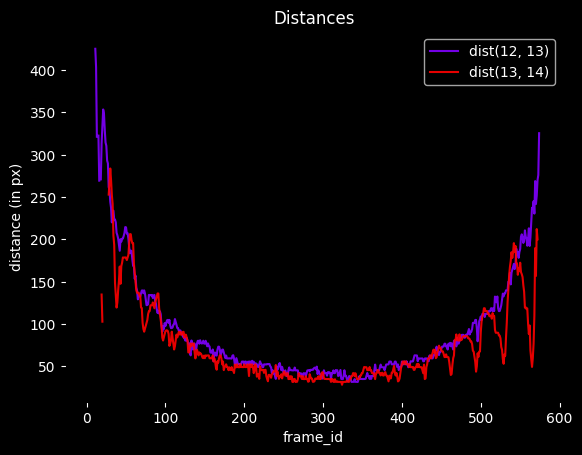

In [101]:
#@title Show code
fig, ax = plt.subplots()
ax.set_xlabel('frame_id')
ax.set_ylabel('distance (in px)')
ax.set_title('Distances')
colors = mpl.cm.rainbow(np.linspace(0, 1, len(points_of_interest)))

x_df2 = -df2.filter(regex='x_')
y_df2 = -df2.filter(regex='y_')
c_df2 = -df2.filter(regex='c_')
xdfcp = x_df2.iloc[:, 0:25]
ydfcp = y_df2.iloc[:, 0:25]

counter = 0
for p0, p1 in points_of_interest:
    # Convert into string format
    p0 = f'0{p0}' if p0 < 10 else f'{p0}'
    p1 = f'0{p1}' if p1 < 10 else f'{p1}'

    dists = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
        + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)

    ax.plot(df2.index, dists, color=colors[counter], label=f'dist({p0}, {p1})', alpha=0.9)
    counter += 1

ax.legend()
plt.show()

<font color='cyan'>Angles:</font>

In [102]:
# Represent a joint as follows:
# [(point_0, point_1), (point_2, point_3)]
# Example: [(9, 10), (10, 11)] - left knee

joints_of_interest = [] # SET MANUALLY by uncommenting the rows or appending manually
joints_of_interest.append([(9, 10), (10, 11)])  # left knee
joints_of_interest.append([(12, 13), (13, 14)])  # right knee
#joints_of_interest.append([(8, 12), (9, 8)])  # pelvis
#joints_of_interest.append([(8, 12), (8, 9)])  # pelvis: order of the points in the vector changed

#joints_of_interest.append()

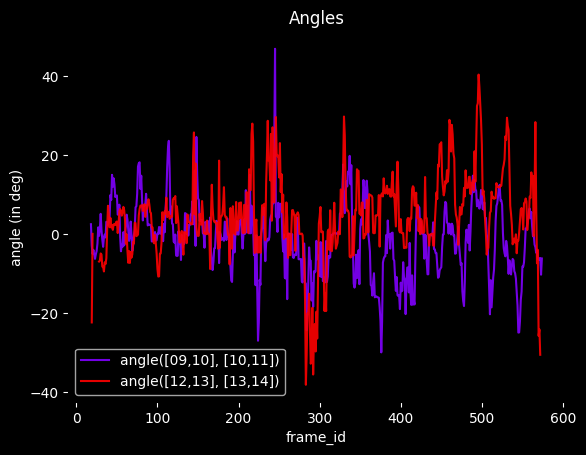

In [103]:
#@title Show code
fig, ax = plt.subplots()
ax.set_xlabel('frame_id')
ax.set_ylabel('angle (in deg)')
ax.set_title('Angles')
colors = mpl.cm.rainbow(np.linspace(0, 1, len(joints_of_interest)))

x_df2 = -df2.filter(regex='x_')
y_df2 = -df2.filter(regex='y_')
c_df2 = -df2.filter(regex='c_')
xdfcp = x_df2.iloc[:, 0:25]
ydfcp = y_df2.iloc[:, 0:25]

counter = 0
for (p0, p1), (p2, p3) in joints_of_interest:
    # Convert into string format
    p0 = f'0{p0}' if p0 < 10 else f'{p0}'
    p1 = f'0{p1}' if p1 < 10 else f'{p1}'
    p2 = f'0{p2}' if p2 < 10 else f'{p2}'
    p3 = f'0{p3}' if p3 < 10 else f'{p3}'

#### STABLE VERSION ###############
    vects1 = np.array((xdfcp[f'x_{p1}'] - xdfcp[f'x_{p0}'], ydfcp[f'y_{p1}'] - ydfcp[f'y_{p0}']))
    vects2 = np.array((xdfcp[f'x_{p3}'] - xdfcp[f'x_{p2}'], ydfcp[f'y_{p3}'] - ydfcp[f'y_{p2}']))
    dot_prod = np.sum(vects1 * vects2, axis=0)
    cross_prod = np.cross(
        vects1,
        vects2,
        axisa=0,
        axisb=0,
        axis=0
    )

    sine = cross_prod / (np.linalg.norm(vects1, axis=0) * np.linalg.norm(vects2, axis=0))
    angles_rad = np.where(
        np.abs(sine) <= 0.5,
        np.where(dot_prod > 0, np.arcsin(sine), np.where(sine >= 0, np.pi - np.arcsin(sine), -np.pi - np.arcsin(sine))),
        (-1 * (cross_prod < 0) + 1 * (cross_prod >= 0)) \
            * np.arccos(dot_prod / (np.linalg.norm(vects1, axis=0) * np.linalg.norm(vects2, axis=0)))
    )
    angles_deg = np.degrees(angles_rad)
####################################

    ax.plot(df2.index, angles_deg, color=colors[counter], label=f'angle([{p0},{p1}], [{p2},{p3}])', alpha=0.9)
    counter += 1

ax.legend()
plt.show()

Now distances for resized оп2 (second set of data):

In [104]:
points_of_interest = [] # SET MANUALLY by uncommenting the rows or appending manually
#points_of_interest.extend([(12, 13), (13, 14)])  # right leg
points_of_interest.extend([(9, 10), (10, 11)])  # left leg
#points_of_interest.extend([(8, 12), (8, 9)])  # pelvis

#points_of_interest.extend([(10, 11), (13, 14), (11, 14)])

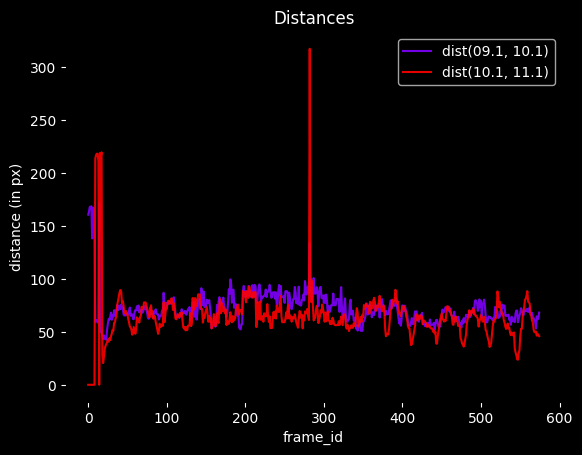

In [105]:
#@title Show code
fig, ax = plt.subplots()
ax.set_xlabel('frame_id')
ax.set_ylabel('distance (in px)')
ax.set_title('Distances')
colors = mpl.cm.rainbow(np.linspace(0, 1, len(points_of_interest)))

x_df2 = -df2.filter(regex='x_')
y_df2 = -df2.filter(regex='y_')
c_df2 = -df2.filter(regex='c_')
xdfcp = x_df2.iloc[:, 25:]
ydfcp = y_df2.iloc[:, 25:]

counter = 0
for p0, p1 in points_of_interest:
    # Convert into string format
    p0 = f'0{p0}.1' if p0 < 10 else f'{p0}.1'
    p1 = f'0{p1}.1' if p1 < 10 else f'{p1}.1'

    dists = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
        + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)

    ax.plot(df2.index, dists, color=colors[counter], label=f'dist({p0}, {p1})', alpha=0.9)
    counter += 1

ax.legend()
plt.show()

In [106]:
# Represent a joint as follows:
# [(point_0, point_1), (point_2, point_3)]
# Example: [(9, 10), (10, 11)] - left knee

joints_of_interest = [] # SET MANUALLY by uncommenting the rows or appending manually
joints_of_interest.append([(9, 10), (10, 11)])  # left knee
joints_of_interest.append([(12, 13), (13, 14)])  # right knee
#joints_of_interest.append([(8, 12), (9, 8)])  # pelvis
#joints_of_interest.append([(8, 12), (8, 9)])  # pelvis: order of the points in the vector changed

#joints_of_interest.append()

C:\Users\User\AppData\Local\Temp\ipykernel_15648\459501010.py:34: RuntimeWarning: invalid value encountered in divide
  sine = cross_prod / (np.linalg.norm(vects1, axis=0) * np.linalg.norm(vects2, axis=0))
C:\Users\User\AppData\Local\Temp\ipykernel_15648\459501010.py:39: RuntimeWarning: invalid value encountered in divide
  * np.arccos(dot_prod / (np.linalg.norm(vects1, axis=0) * np.linalg.norm(vects2, axis=0)))


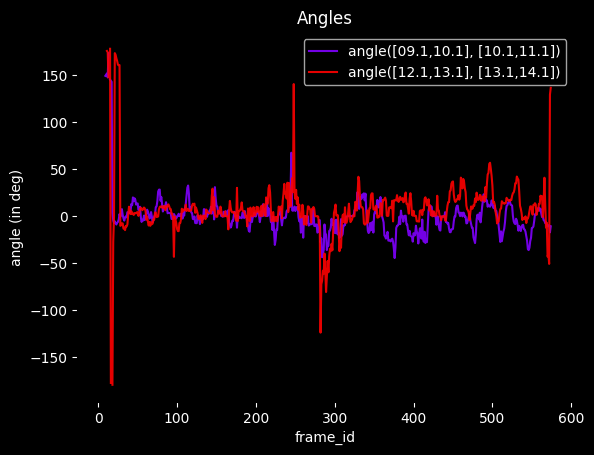

In [107]:
#@title Show code
fig, ax = plt.subplots()
ax.set_xlabel('frame_id')
ax.set_ylabel('angle (in deg)')
ax.set_title('Angles')
colors = mpl.cm.rainbow(np.linspace(0, 1, len(joints_of_interest)))

x_df2 = -df2.filter(regex='x_')
y_df2 = -df2.filter(regex='y_')
c_df2 = -df2.filter(regex='c_')
xdfcp = x_df2.iloc[:, 25:]
ydfcp = y_df2.iloc[:, 25:]

counter = 0
for (p0, p1), (p2, p3) in joints_of_interest:
    # Convert into string format
    p0 = f'0{p0}.1' if p0 < 10 else f'{p0}.1'
    p1 = f'0{p1}.1' if p1 < 10 else f'{p1}.1'
    p2 = f'0{p2}.1' if p2 < 10 else f'{p2}.1'
    p3 = f'0{p3}.1' if p3 < 10 else f'{p3}.1'

#### STABLE VERSION ###############
    vects1 = np.array((xdfcp[f'x_{p1}'] - xdfcp[f'x_{p0}'], ydfcp[f'y_{p1}'] - ydfcp[f'y_{p0}']))
    vects2 = np.array((xdfcp[f'x_{p3}'] - xdfcp[f'x_{p2}'], ydfcp[f'y_{p3}'] - ydfcp[f'y_{p2}']))
    dot_prod = np.sum(vects1 * vects2, axis=0)
    cross_prod = np.cross(
        vects1,
        vects2,
        axisa=0,
        axisb=0,
        axis=0
    )

    sine = cross_prod / (np.linalg.norm(vects1, axis=0) * np.linalg.norm(vects2, axis=0))
    angles_rad = np.where(
        np.abs(sine) <= 0.5,
        np.where(dot_prod > 0, np.arcsin(sine), np.where(sine >= 0, np.pi - np.arcsin(sine), -np.pi - np.arcsin(sine))),
        (-1 * (cross_prod < 0) + 1 * (cross_prod >= 0)) \
            * np.arccos(dot_prod / (np.linalg.norm(vects1, axis=0) * np.linalg.norm(vects2, axis=0)))
    )
    angles_deg = np.degrees(angles_rad)
####################################

    ax.plot(df2.index, angles_deg, color=colors[counter], label=f'angle([{p0},{p1}], [{p2},{p3}])', alpha=0.9)
    counter += 1

ax.legend()
plt.show()

<font color='red'>Note 1</font>: data in frame 423 is incorrect for this example <br>
If data is nan instead of zeroes, everything works <br>
<font color='red'>Note 2</font>: data for the angles seems to be different in comparison with the unchanged data in "оп2". <br>
Possible causes: transformation not preserving angles

<h2> <font color='red'>"video_03"</font> distances and angles </h2>

<h3> Understanding the data </h3>

In [112]:
df = xlsm['video_03']
x_df = -df.filter(regex='x_')
y_df = -df.filter(regex='y_')
c_df = df.filter(regex='c_')
xdfcp = x_df.iloc[:, 0:25]
ydfcp = y_df.iloc[:, 0:25]

In [113]:
fps = 30  # set manually
resolution_x, resolution_y = 720, 1280  # set manually
frames_range = range(2200, 2400)  # what frames to show
fix_limits = True

hardlim = resolution_x // 2  # limit axes (set manually [if fix_limits==True])
offset = resolution_x // 2  # center of the picture offset (set manually [if fix_limits==True])


ratio = resolution_x / resolution_y

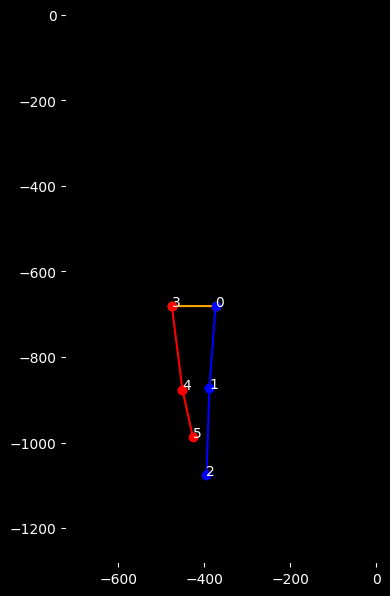

In [114]:
#@title Show code
size = 4
fig, ax = plt.subplots(figsize=(size * ratio, size) if ratio > 1 else (size, size * 1 / ratio))
# scatter = ax.scatter([], [], color='orange')
# ax.set_xlim(xdfcp.dropna().values.min() - 1, xdfcp.dropna().values.max() + 1)
# ax.set_ylim(ydfcp.dropna().values.min() - 1, ydfcp.dropna().values.max() + 1)
ax.set_xlim(-hardlim - offset, hardlim - offset)
ax.set_ylim((-hardlim - offset) / ratio, (hardlim - offset) / ratio)

prev_annotations = []
lines = []
def update(frame):

    global lines
    global prev_annotations
    for line in lines:
        line.remove()

    lines = []
    if not fix_limits:
        ax.set_xlim(np.nanmin(xdfcp.iloc[frame].values) - 20, np.nanmax(xdfcp.iloc[frame].values) + 20)
        ax.set_ylim(np.nanmin(ydfcp.iloc[frame].values) - 20, np.nanmax(ydfcp.iloc[frame].values) + 20)


    # pelvis
    prev_x = xdfcp.iloc[frame, 0]
    prev_y = ydfcp.iloc[frame, 0]
    x = xdfcp.iloc[frame, 3]
    y = ydfcp.iloc[frame, 3]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='orange')
    lines.append(line)

    # left leg
    for i in range(4, 6):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)

    # right leg
    for i in range(1, 3):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)


    for annotation in prev_annotations:
        annotation.remove()
    prev_annotations = annotate_points(xdfcp.iloc[frame], ydfcp.iloc[frame])
    return lines

def annotate_points(x_data, y_data):
    annotations = []
    for i, (x, y) in enumerate(zip(x_data, y_data)):
        annotation = ax.annotate(str(i), (x, y), color='white')
        annotations.append(annotation)
    return annotations

# Create the animation
ani = FuncAnimation(fig, update, frames=frames_range, interval=1000 / fps)
#plt.grid(True, color='dimgray')


In [131]:
ani

<font color='cyan'>Distances:</font>

<h4>"video_03": <br>
See the image below for reference <br>
(Note: subject walking <font color='crimson'>away</font> from the camera in the picture. <br> In the video the subject walks away from the camera and then returns <font color='gold'>multiple times</font>)
</h4>
<img src="https://raw.githubusercontent.com/oscar-foxtrot/Coxarthrosis-research/main/images/hips_03.png">

In [115]:
#frames_of_interest = (df.index[0], df.index[-1])  # SET MANUALLY
frames_of_interest = (500, 2500)

points_of_interest = [] # SET MANUALLY by uncommenting the rows or appending manually
points_of_interest.extend([(2, 1), (1, 0)])  # right leg
#points_of_interest.extend([(3, 4), (4, 5)])  # left leg
#points_of_interest.extend([(0, 3)])  # pelvis

#points_of_interest.extend([(10, 11), (13, 14), (11, 14)])

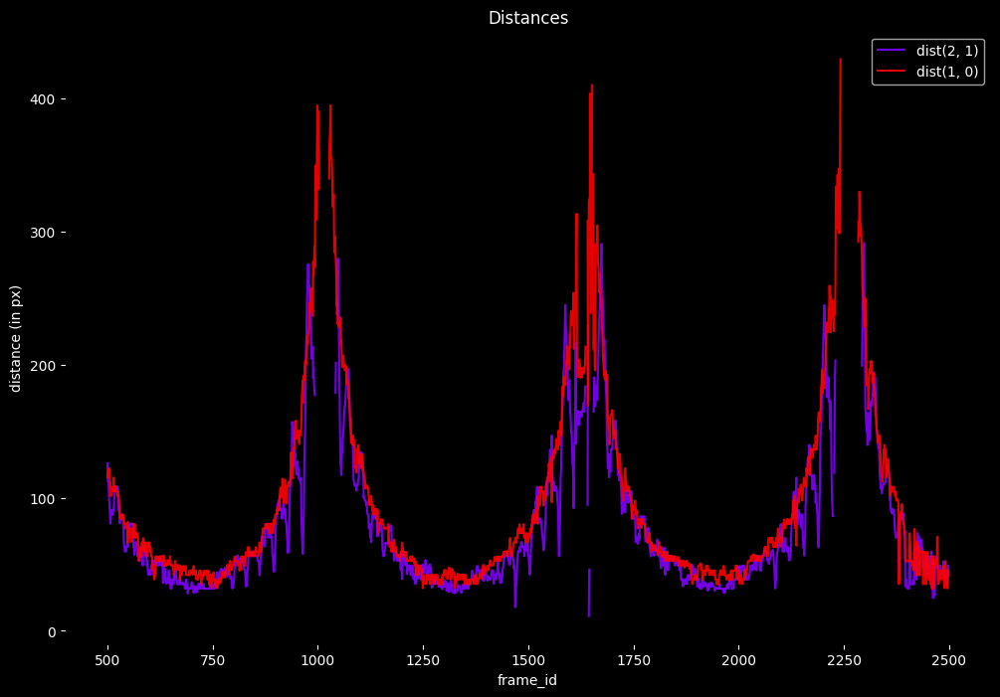

In [116]:
#@title Show code
fig, ax = plt.subplots(figsize=(12, 8))
ax.set_xlabel('frame_id')
ax.set_ylabel('distance (in px)')
ax.set_title('Distances')
colors = mpl.cm.rainbow(np.linspace(0, 1, len(points_of_interest)))


x_df = -df.filter(regex='x_')
y_df = -df.filter(regex='y_')
c_df = -df.filter(regex='c_')
xdfcp = x_df.iloc[:, 0:25]
ydfcp = y_df.iloc[:, 0:25]

offset_df_columns = 9
counter = 0
for p0, p1 in points_of_interest:
    # Convert into string format
    p0 = f'0{p0 + offset_df_columns}' if p0 + offset_df_columns < 10 else f'{p0 + offset_df_columns}'
    p1 = f'0{p1 + offset_df_columns}' if p1 + offset_df_columns < 10 else f'{p1 + offset_df_columns}'

    dists = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
        + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)

    ax.plot(df.index[frames_of_interest[0]: frames_of_interest[1]], dists[frames_of_interest[0]: frames_of_interest[1]], color=colors[counter],
            label=f'dist({int(p0) - offset_df_columns}, {int(p1) - offset_df_columns})', alpha=0.9)
    counter += 1

ax.legend()
plt.show()

<font color='cyan'>Angles:</font>

In [117]:
# Represent a joint as follows:
# [(point_0, point_1), (point_2, point_3)]
# Example: [(9, 10), (10, 11)] - left knee

#frames_of_interest = (df.index[0], df.index[-1])  # SET MANUALLY
frames_of_interest = (500, 900)

joints_of_interest = [] # SET MANUALLY by uncommenting the rows or appending manually
joints_of_interest.append([(5, 4), (4, 3)])  # left knee
joints_of_interest.append([(2, 1), (1, 0)])  # right knee

#joints_of_interest.append()

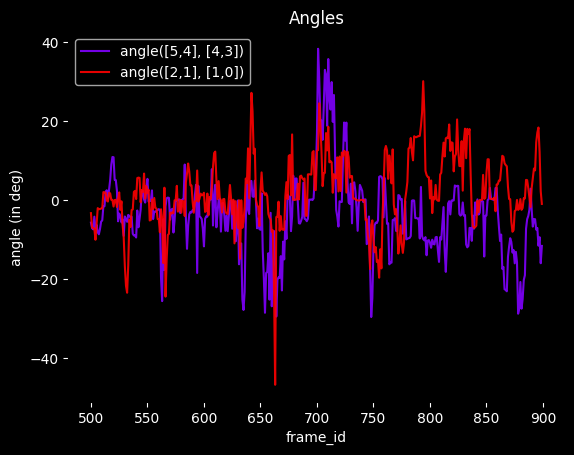

In [118]:
#@title Show code
fig, ax = plt.subplots()
ax.set_xlabel('frame_id')
ax.set_ylabel('angle (in deg)')
ax.set_title('Angles')
colors = mpl.cm.rainbow(np.linspace(0, 1, len(joints_of_interest)))


offset_df_columns = 9
x_df = -df.filter(regex='x_')
y_df = -df.filter(regex='y_')
c_df = -df.filter(regex='c_')
xdfcp = x_df.iloc[:, 0:25]
ydfcp = y_df.iloc[:, 0:25]

counter = 0
for (p0, p1), (p2, p3) in joints_of_interest:
    p0 += offset_df_columns
    p1 += offset_df_columns
    p2 += offset_df_columns
    p3 += offset_df_columns
    # Convert into string format
    p0 = f'0{p0}' if p0 < 10 else f'{p0}'
    p1 = f'0{p1}' if p1 < 10 else f'{p1}'
    p2 = f'0{p2}' if p2 < 10 else f'{p2}'
    p3 = f'0{p3}' if p3 < 10 else f'{p3}'

#### STABLE VERSION ###############
    vects1 = np.array((xdfcp[f'x_{p1}'] - xdfcp[f'x_{p0}'], ydfcp[f'y_{p1}'] - ydfcp[f'y_{p0}']))
    vects2 = np.array((xdfcp[f'x_{p3}'] - xdfcp[f'x_{p2}'], ydfcp[f'y_{p3}'] - ydfcp[f'y_{p2}']))
    dot_prod = np.sum(vects1 * vects2, axis=0)
    cross_prod = np.cross(
        vects1,
        vects2,
        axisa=0,
        axisb=0,
        axis=0
    )

    sine = cross_prod / (np.linalg.norm(vects1, axis=0) * np.linalg.norm(vects2, axis=0))
    angles_rad = np.where(
        np.abs(sine) <= 0.5,
        np.where(dot_prod > 0, np.arcsin(sine), np.where(sine >= 0, np.pi - np.arcsin(sine), -np.pi - np.arcsin(sine))),
        (-1 * (cross_prod < 0) + 1 * (cross_prod >= 0)) \
            * np.arccos(dot_prod / (np.linalg.norm(vects1, axis=0) * np.linalg.norm(vects2, axis=0)))
    )
    angles_deg = np.degrees(angles_rad)
####################################

    ax.plot(df.index[frames_of_interest[0]: frames_of_interest[1]], angles_deg[frames_of_interest[0]: frames_of_interest[1]], color=colors[counter],
            label=f'angle([{int(p0) - offset_df_columns},{int(p1) - offset_df_columns}]' \
            + f', [{int(p2) - offset_df_columns},{int(p3) - offset_df_columns}])', alpha=0.9)
    counter += 1

ax.legend()
plt.show()

<h1> <font color = 'yellow'> Solutions to distance distortion </font> </h1>

<h3>Polynomial regression (?)</h3>

In [119]:
#frames_of_interest = (df.index[0], df.index[-1])  # SET MANUALLY
frames_of_interest = (500, 2500)

points_of_interest = [] # SET MANUALLY by uncommenting the rows or appending manually
points_of_interest.extend([(4, 5), (1, 0)])  # right leg
#points_of_interest.extend([(3, 4), (4, 5)])  # left leg
#points_of_interest.extend([(2, 5)])  # pelvis

#points_of_interest.extend([(10, 11), (13, 14), (11, 14)])

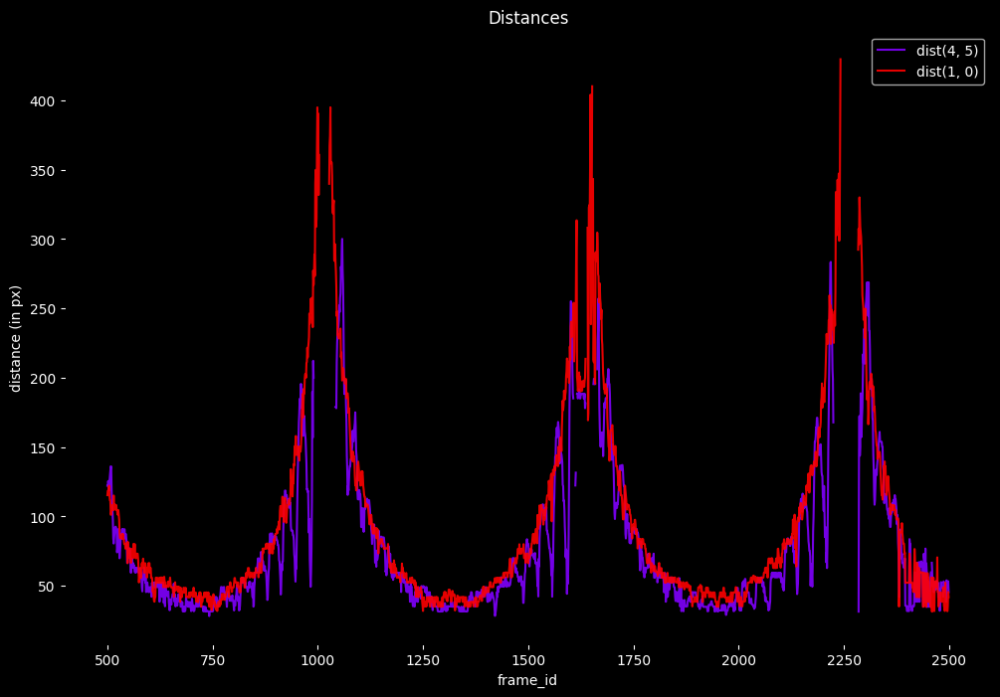

In [120]:
#@title Show code
fig, ax = plt.subplots(figsize=(12, 8))
ax.set_xlabel('frame_id')
ax.set_ylabel('distance (in px)')
ax.set_title('Distances')
colors = mpl.cm.rainbow(np.linspace(0, 1, len(points_of_interest)))


x_df = -df.filter(regex='x_')
y_df = -df.filter(regex='y_')
c_df = -df.filter(regex='c_')
xdfcp = x_df.iloc[:, 0:25]
ydfcp = y_df.iloc[:, 0:25]

offset_df_columns = 9
counter = 0
for p0, p1 in points_of_interest:
    # Convert into string format
    p0 = f'0{p0 + offset_df_columns}' if p0 + offset_df_columns < 10 else f'{p0 + offset_df_columns}'
    p1 = f'0{p1 + offset_df_columns}' if p1 + offset_df_columns < 10 else f'{p1 + offset_df_columns}'

    dists = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
        + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)

    ax.plot(df.index[frames_of_interest[0]: frames_of_interest[1]], dists[frames_of_interest[0]: frames_of_interest[1]], color=colors[counter],
            label=f'dist({int(p0) - offset_df_columns}, {int(p1) - offset_df_columns})', alpha=0.9)
    counter += 1

ax.legend()
plt.show()

In [121]:
#frames_of_interest = (df.index[0], df.index[-1])  # SET MANUALLY
frames_of_interest = (600, 1400)

points_of_interest = [] # SET MANUALLY by uncommenting the rows or appending manually
points_of_interest.extend([(4, 5), (0, 1)])
#points_of_interest.extend([(2, 1), (1, 0)])  # right leg
#points_of_interest.extend([(3, 4), (4, 5)])  # left leg
#points_of_interest.extend([(0, 3)])  # pelvis


dist_points_to_train_on = ((1, 2))  # Specify 2 points whose data will be used in regression model training
polynomial_degree = 6

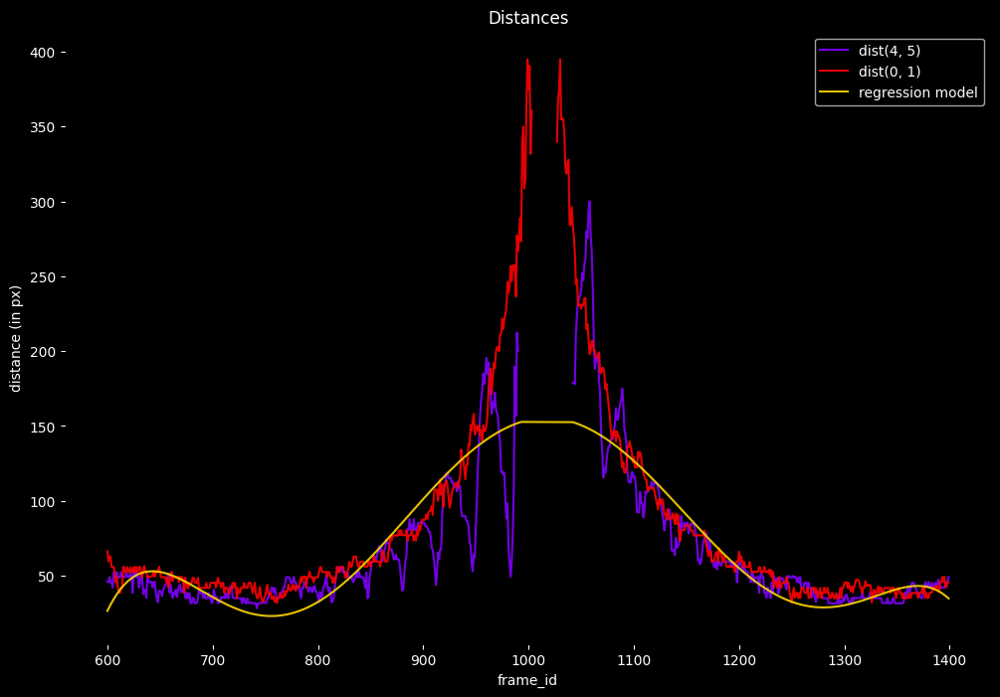

In [122]:
#@title Show code

offset_df_columns = 9

### Training
p0 = dist_points_to_train_on[0]
p1 = dist_points_to_train_on[1]
p0 = f'0{p0 + offset_df_columns}' if p0 + offset_df_columns < 10 else f'{p0 + offset_df_columns}'
p1 = f'0{p1 + offset_df_columns}' if p1 + offset_df_columns < 10 else f'{p1 + offset_df_columns}'
dists = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
        + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)

temp_ids = np.isfinite(df['frame_id']) & np.isfinite(dists)
indx = df.index[(df.index >= frames_of_interest[0]) & (df.index < frames_of_interest[-1]) & temp_ids]
coefs = np.polyfit(df.index[indx], dists[indx], deg=polynomial_degree)
regression = 0
for i in range(0, len(coefs)):
    degree = len(coefs) - 1 - i
    regression += coefs[i] * df.index[indx]**degree


### Other code
fig, ax = plt.subplots(figsize=(12, 8))
ax.set_xlabel('frame_id')
ax.set_ylabel('distance (in px)')
ax.set_title('Distances')
colors = mpl.cm.rainbow(np.linspace(0, 1, len(points_of_interest)))


x_df = -df.filter(regex='x_')
y_df = -df.filter(regex='y_')
c_df = -df.filter(regex='c_')
xdfcp = x_df.iloc[:, 0:25]
ydfcp = y_df.iloc[:, 0:25]

counter = 0
for p0, p1 in points_of_interest:
    # Convert into string format
    p0 = f'0{p0 + offset_df_columns}' if p0 + offset_df_columns < 10 else f'{p0 + offset_df_columns}'
    p1 = f'0{p1 + offset_df_columns}' if p1 + offset_df_columns < 10 else f'{p1 + offset_df_columns}'

    dists = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
        + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)

    ax.plot(df.index[frames_of_interest[0]: frames_of_interest[1]], dists[frames_of_interest[0]: frames_of_interest[1]], color=colors[counter],
            label=f'dist({int(p0) - offset_df_columns}, {int(p1) - offset_df_columns})', alpha=0.9)
    counter += 1

ax.plot(df.index[indx],
        regression, label=f'regression model', color='gold', alpha=0.9)
ax.legend()
plt.show()

In [123]:
# Regression coefficients
print(coefs)

[-1.67303691e-13  1.01692842e-09 -2.52509882e-06  3.27417394e-03
 -2.33614590e+00  8.69501089e+02 -1.31901032e+05]


Polynomials may not be suitable here as it shows. But only for the whole process. We can do the approximation in separate regions.

Again, for reference: <br>
(Subject walking away from the camera) <br>
<img src="https://raw.githubusercontent.com/oscar-foxtrot/Coxarthrosis-research/main/images/hips_03.png">

<h3>Arctangent rule + Curve fitting</h3>

When the subject is walking away from the camera, the observed length of all connections should follow some "arctangent" rule. <br>
If we assume that the camera is standing still and is pointed towards the subject, then their visible height (hence all of the "steady" body parts' lengths) will change proportionally to the angle at which the subject is visible <br> <br>
<img src="https://raw.githubusercontent.com/oscar-foxtrot/Coxarthrosis-research/main/images/sketch2.png"> <br>

Under some assumptions: <br>
1. Camera is pointed strictly in the same direction the subject is walking at <br>
2. Camera is located at the subject's waist level (half the height) <br>
Let $d$ be the distance between the subject and the camera, <br> $h$ - their height, $α$ - subject's (subject's body part's) visible angle <br>
Then: &nbsp; $tan(\frac{\alpha}{2}) = \frac{h / 2}{d}$ <br>
$ => α = 2* arctan(\frac{h / 2}{d})$ <br>
Hence the proportion of the height to the screen vertical resolution is the same as $π / α$ <br>
The subject's motion is approximately *linear*. Hence:<br>
$d = d(t) = v * t + x_0$, &nbsp; <br>
where $x_0$ - distance at the start of the process, $v = const$ - velocity <br>
<br>
$α(t) = \pi * h_{visible} / vert.resolution$
$$\alpha = 2 * arctan(\frac{h/2}{d}) =>$$
$$=> \alpha = 2 * arctan(\frac{h/2}{vt + x_0})$$

<br>
$arctan(x)∼∑_{k=1}^{∞}\frac{(−1)^{k−1}}{2k - 1}x^{2k−1}$,&nbsp;&nbsp; converges if the argument's absolute value is <= 1

Let $p$ (proportion) be $\frac{d}{h}$ <br>
Then $\alpha = 2 * arctan(\frac{1}{2p})$ <br>
Hence, if $p >= 1/2$, the series converges. Let us approximate: <br>
$$\alpha ≈ 2\left((\frac{1}{2p}) - \frac{1}{3}(\frac{1}{2p})^3 + \frac{1}{5}(\frac{1}{2p})^5 - \frac{1}{7}(\frac{1}{2p})^7 + \frac{1}{9}(\frac{1}{2p})^9 - \frac{1}{11}(\frac{1}{2p})^{11}\right)$$ <br>
Note that $p$ is changing linearly with time in our model. <br>
The error of the series is <= last_term
The series error at p >= 1 gives the error of $h_{visible}$ (in px) (see the formula in the beginning) of about $≈$ 0.018 px with vertical resolution of 1280 px, which is negligible

<br>
<h4> The model training process would include only the search of optimal <font color='pink'>$x_0/h$</font> and <font color='pink'>$v/h$</font> that would constitute $p$<br>
<br>
Let's try now:
</h4>

In [124]:
from scipy.optimize import curve_fit
from sklearn.metrics import r2_score

In [131]:
dist_points_to_train_on = ((1, 2))  # SET MANUALLY
frames_of_interest = (1649, 1880)

vert_resolution = 1280
def func(t, vh, x0h):
    p = t*vh + x0h
    alpha = 2 * ((1/(2 * p)) - 1/3 * (1/(2*p))**3 + 1/5 * (1/(2 * p))**5 \
                 - 1/7 * (1/(2 * p))**7 + 1/9 * (1/(2 * p))**9 - 1/11 * (1/(2 * p))**11)
    return alpha / np.pi * vert_resolution

In [132]:
offset_df_columns = 9
p0 = dist_points_to_train_on[0]
p1 = dist_points_to_train_on[1]
p0 = f'0{p0 + offset_df_columns}' if p0 + offset_df_columns < 10 else f'{p0 + offset_df_columns}'
p1 = f'0{p1 + offset_df_columns}' if p1 + offset_df_columns < 10 else f'{p1 + offset_df_columns}'

In [134]:
dists = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
        + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)
temp_ids = np.isfinite(df['frame_id']) & np.isfinite(dists)
indx = df.index[(df.index >= frames_of_interest[0]) & (df.index < frames_of_interest[-1]) & temp_ids]

In [145]:
#frames_of_interest = (df.index[0], df.index[-1])  # SET MANUALLY
frames_of_interest = (1649, 1880)

points_of_interest = [] # SET MANUALLY by uncommenting the rows or appending manually
points_of_interest.extend([(1, 0)])  # right leg
#points_of_interest.extend([(3, 4), (4, 5)])  # left leg
#points_of_interest.extend([(2, 5)])  # pelvis

dist_points_to_train_on = ((1, 0))  # SET MANUALLY
vert_resolution = 1280

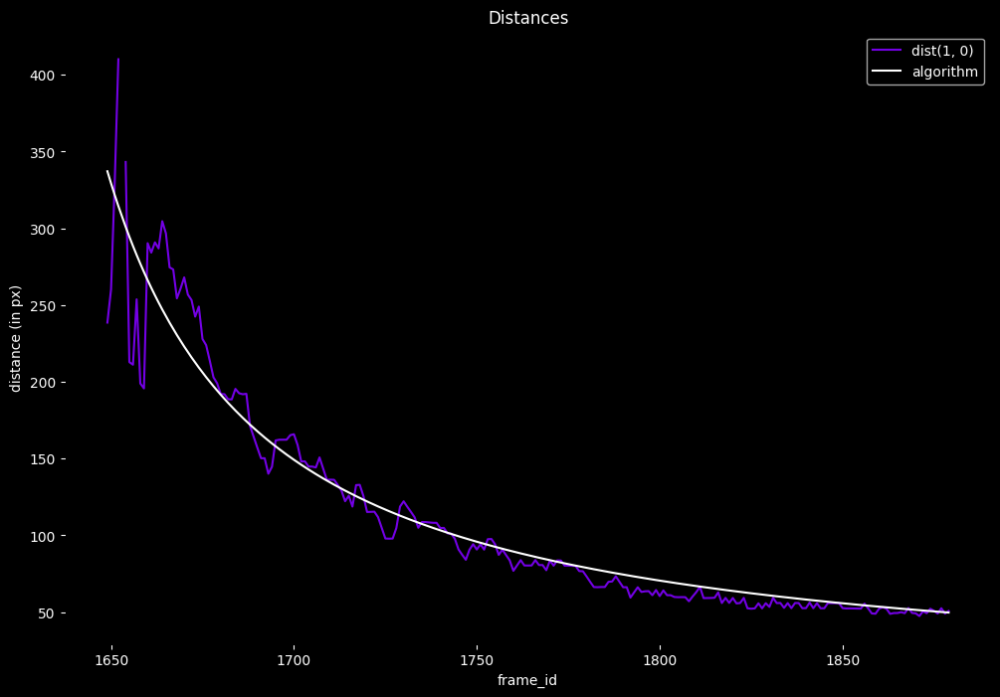

In [172]:
#@title Show code
fig, ax = plt.subplots(figsize=(12, 8))
ax.set_xlabel('frame_id')
ax.set_ylabel('distance (in px)')
ax.set_title('Distances')
colors = mpl.cm.rainbow(np.linspace(0, 1, len(points_of_interest)))

offset_df_columns = 9
p0 = dist_points_to_train_on[0]
p1 = dist_points_to_train_on[1]
p0 = f'0{p0 + offset_df_columns}' if p0 + offset_df_columns < 10 else f'{p0 + offset_df_columns}'
p1 = f'0{p1 + offset_df_columns}' if p1 + offset_df_columns < 10 else f'{p1 + offset_df_columns}'
dists = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
        + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)
temp_ids = np.isfinite(df['frame_id']) & np.isfinite(dists)
indx = df.index[(df.index >= frames_of_interest[0]) & (df.index < frames_of_interest[-1]) & temp_ids]

#### WE CAN WEIGH THE GRAPH, SO IT DOESNT LEARN THE LARGER FUNCTION VALUES TOO MUCH
curve = curve_fit(func, df['frame_id'][indx], dists[indx])


x_df = -df.filter(regex='x_')
y_df = -df.filter(regex='y_')
c_df = -df.filter(regex='c_')
xdfcp = x_df.iloc[:, 0:25]
ydfcp = y_df.iloc[:, 0:25]

offset_df_columns = 9
counter = 0
for p0, p1 in points_of_interest:
    # Convert into string format
    p0 = f'0{p0 + offset_df_columns}' if p0 + offset_df_columns < 10 else f'{p0 + offset_df_columns}'
    p1 = f'0{p1 + offset_df_columns}' if p1 + offset_df_columns < 10 else f'{p1 + offset_df_columns}'

    dists = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
        + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)

    ax.plot(df.index[frames_of_interest[0]: frames_of_interest[1]], dists[frames_of_interest[0]: frames_of_interest[1]], color=colors[counter],
            label=f'dist({int(p0) - offset_df_columns}, {int(p1) - offset_df_columns})', alpha=0.9)
    counter += 1

ax.plot(df['frame_id'][indx], [func(x, curve[0][0], curve[0][1]) for x in df['frame_id'][indx]], color='white', label='algorithm')
ax.legend()
plt.show()

In [173]:
### EXECUTE TO SEE R2_SCORE

offset_df_columns = 9
p0 = dist_points_to_train_on[0]
p1 = dist_points_to_train_on[1]
p0 = f'0{p0 + offset_df_columns}' if p0 + offset_df_columns < 10 else f'{p0 + offset_df_columns}'
p1 = f'0{p1 + offset_df_columns}' if p1 + offset_df_columns < 10 else f'{p1 + offset_df_columns}'
dists = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
        + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)

print(r2_score(y_true=dists[indx], y_pred=[func(x, curve[0][0], curve[0][1]) for x in df['frame_id'][indx]]))

0.9274445110254407


Compare with polynomial regression:

In [174]:
polynomial_degree = 4

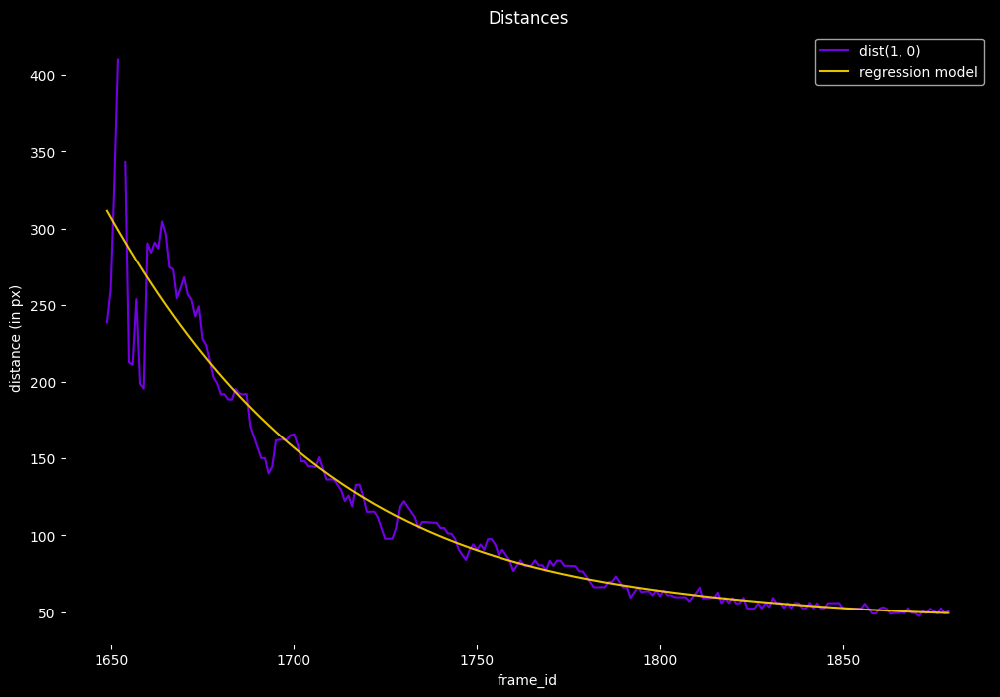

In [175]:
#@title Show code

offset_df_columns = 9

### Training
p0 = dist_points_to_train_on[0]
p1 = dist_points_to_train_on[1]
p0 = f'0{p0 + offset_df_columns}' if p0 + offset_df_columns < 10 else f'{p0 + offset_df_columns}'
p1 = f'0{p1 + offset_df_columns}' if p1 + offset_df_columns < 10 else f'{p1 + offset_df_columns}'
dists = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
        + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)

temp_ids = np.isfinite(df['frame_id']) & np.isfinite(dists)
indx = df.index[(df.index >= frames_of_interest[0]) & (df.index < frames_of_interest[-1]) & temp_ids]
coefs = np.polyfit(df.index[indx], dists[indx], deg=polynomial_degree)
regression = 0
for i in range(0, len(coefs)):
    degree = len(coefs) - 1 - i
    regression += coefs[i] * df.index[indx]**degree


### Other code
fig, ax = plt.subplots(figsize=(12, 8))
ax.set_xlabel('frame_id')
ax.set_ylabel('distance (in px)')
ax.set_title('Distances')
colors = mpl.cm.rainbow(np.linspace(0, 1, len(points_of_interest)))


x_df = -df.filter(regex='x_')
y_df = -df.filter(regex='y_')
c_df = -df.filter(regex='c_')
xdfcp = x_df.iloc[:, 0:25]
ydfcp = y_df.iloc[:, 0:25]

counter = 0
for p0, p1 in points_of_interest:
    # Convert into string format
    p0 = f'0{p0 + offset_df_columns}' if p0 + offset_df_columns < 10 else f'{p0 + offset_df_columns}'
    p1 = f'0{p1 + offset_df_columns}' if p1 + offset_df_columns < 10 else f'{p1 + offset_df_columns}'

    dists = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
        + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)

    ax.plot(df.index[frames_of_interest[0]: frames_of_interest[1]], dists[frames_of_interest[0]: frames_of_interest[1]], color=colors[counter],
            label=f'dist({int(p0) - offset_df_columns}, {int(p1) - offset_df_columns})', alpha=0.9)
    counter += 1

ax.plot(df.index[indx],
        regression, label=f'regression model', color='gold', alpha=0.9)
ax.legend()
plt.show()

In [176]:
### EXECUTE TO SEE R2_SCORE

offset_df_columns = 9
p0 = dist_points_to_train_on[0]
p1 = dist_points_to_train_on[1]
p0 = f'0{p0 + offset_df_columns}' if p0 + offset_df_columns < 10 else f'{p0 + offset_df_columns}'
p1 = f'0{p1 + offset_df_columns}' if p1 + offset_df_columns < 10 else f'{p1 + offset_df_columns}'
dists = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
        + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)

print(r2_score(y_true=dists[indx], y_pred=regression))

0.9406719401465868


Let's see train/test scores

In [177]:
##### TRAIN TRAIN TRAIN

frames_of_interest_train = (1649, 1780)

points_of_interest = [] # SET MANUALLY by uncommenting the rows or appending manually
points_of_interest.extend([(1, 0)])  # right leg
#points_of_interest.extend([(3, 4), (4, 5)])  # left leg
#points_of_interest.extend([(2, 5)])  # pelvis

dist_points_to_train_on = ((1, 0))  # SET MANUALLY
vert_resolution = 1280

In [178]:
#@title Execute to train
offset_df_columns = 9
p0 = dist_points_to_train_on[0]
p1 = dist_points_to_train_on[1]
p0 = f'0{p0 + offset_df_columns}' if p0 + offset_df_columns < 10 else f'{p0 + offset_df_columns}'
p1 = f'0{p1 + offset_df_columns}' if p1 + offset_df_columns < 10 else f'{p1 + offset_df_columns}'
dists_1 = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
        + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)
temp_ids = np.isfinite(df['frame_id']) & np.isfinite(dists_1)
indx1 = df.index[(df.index >= frames_of_interest_train[0]) & (df.index < frames_of_interest_train[-1]) & temp_ids]

train_curve = curve_fit(func, df['frame_id'][indx1], dists_1[indx1])
coefs = np.polyfit(df.index[indx1], dists_1[indx1], deg=polynomial_degree)
regression_train = 0
for i in range(0, len(coefs)):
    degree = len(coefs) - 1 - i
    regression_train += coefs[i] * df.index[indx1]**degree

In [179]:
##### TEST TEST TEST

frames_of_interest_test = (1781, 1880)

points_of_interest = [] # SET MANUALLY by uncommenting the rows or appending manually
points_of_interest.extend([(1, 0)])  # right leg
#points_of_interest.extend([(3, 4), (4, 5)])  # left leg
#points_of_interest.extend([(2, 5)])  # pelvis

dist_points_to_test_on = ((1, 0))  # SET MANUALLY
vert_resolution = 1280

In [180]:
#@title Execute to test
offset_df_columns = 9
p0 = dist_points_to_test_on[0]
p1 = dist_points_to_test_on[1]
p0 = f'0{p0 + offset_df_columns}' if p0 + offset_df_columns < 10 else f'{p0 + offset_df_columns}'
p1 = f'0{p1 + offset_df_columns}' if p1 + offset_df_columns < 10 else f'{p1 + offset_df_columns}'
dists_2 = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
        + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)
temp_ids = np.isfinite(df['frame_id']) & np.isfinite(dists_2)
indx2 = df.index[(df.index >= frames_of_interest_test[0]) & (df.index < frames_of_interest_test[-1]) & temp_ids]

regression_test = 0
for i in range(0, len(coefs)):
    degree = len(coefs) - 1 - i
    regression_test += coefs[i] * df.index[indx2]**degree

In [181]:
### EXECUTE TO SEE R2_SCORES

print(f'Poly regression::train: {r2_score(y_true=dists_1[indx1], y_pred=regression_train)}')
print(f'Custom algorithm 1::train: {r2_score(y_true=dists_1[indx1], y_pred=[func(x, train_curve[0][0], train_curve[0][1]) for x in df["frame_id"][indx1]])}')
print(f'Poly regression::test: {r2_score(y_true=dists_2[indx2], y_pred=regression_test)}')
print(f'Custom algorithm 1::test: {r2_score(y_true=dists_2[indx2], y_pred=[func(x, train_curve[0][0], train_curve[0][1]) for x in df["frame_id"][indx2]])}')

Poly regression::train: 0.9006336959955329
Custom algorithm 1::train: 0.8784636654049793
Poly regression::test: -17002.938198653363
Custom algorithm 1::test: -1.017999864617157


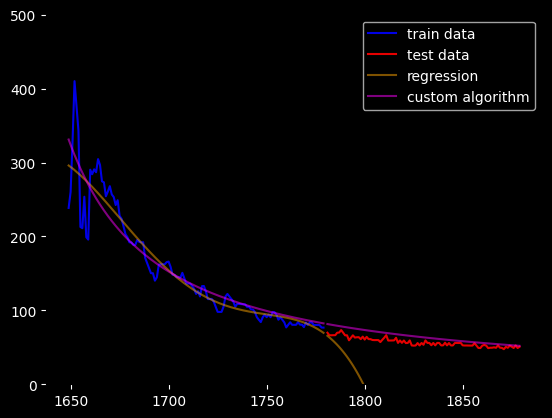

In [182]:
fig, ax = plt.subplots()
ax.set_ylim(0, 500)
ax.plot(df.index[indx1], dists_1[indx1], color='blue', label='train data', alpha=0.9)
ax.plot(df.index[indx2], dists_2[indx2], color='red', label='test data', alpha=0.9)
ax.plot(df.index[indx1], regression_train, color='orange', label='regression', alpha=0.5)
ax.plot(df.index[indx2], regression_test, color='orange', alpha=0.5)
ax.plot(df.index[indx1], [func(x, train_curve[0][0], train_curve[0][1]) for x in df["frame_id"][indx1]], color='magenta', label='custom algorithm', alpha=0.5)
ax.plot(df.index[indx2], [func(x, train_curve[0][0], train_curve[0][1]) for x in df["frame_id"][indx2]], color='magenta', alpha=0.5)
ax.legend()
plt.show()

In [193]:
'''
plt.plot(df.index[indx1], dists_1[indx1] / np.array([func(x, train_curve[0][0], train_curve[0][1]) for x in df["frame_id"][indx1]]), color='orange', label='regression', alpha=0.5)
plt.plot(df.index[indx1], dists_1[indx1] - np.array([func(x, train_curve[0][0], train_curve[0][1]) for x in df["frame_id"][indx1]]), color='orange', label='regression', alpha=0.5)
plt.show()
'''

'\nplt.plot(df.index[indx1], dists_1[indx1] / np.array([func(x, train_curve[0][0], train_curve[0][1]) for x in df["frame_id"][indx1]]), color=\'orange\', label=\'regression\', alpha=0.5)\nplt.plot(df.index[indx1], dists_1[indx1] - np.array([func(x, train_curve[0][0], train_curve[0][1]) for x in df["frame_id"][indx1]]), color=\'orange\', label=\'regression\', alpha=0.5)\nplt.show()\n'

Results for extrapolation are above <br>
The algorithm we're looking for needs to be good only at interpolation though

<h3>Peak detection</h3>

<h4> We need a piecewise-defined function <br>
For this purpose, we'll need to detect all peaks (number of moments the person got close to the camera) <h4>

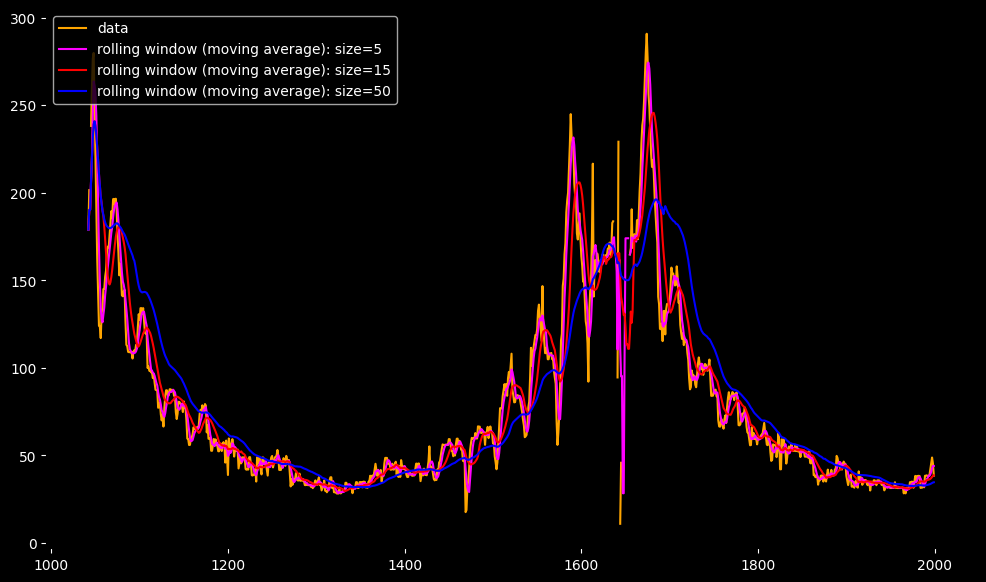

In [160]:
frames_of_interest = (1000, 2000)

fig, ax = plt.subplots(figsize=(12, 7))

ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]], dists[frames_of_interest[0]: frames_of_interest[-1]],
         color='orange', label='data')
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]],
         dists[frames_of_interest[0]: frames_of_interest[-1]].rolling(5, min_periods=1).mean(),
         color='magenta', label='rolling window (moving average): size=5')
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]],
         dists[frames_of_interest[0]: frames_of_interest[-1]].rolling(15, min_periods=1).mean(),
         color='red', label='rolling window (moving average): size=15')
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]],
         dists[frames_of_interest[0]: frames_of_interest[-1]].rolling(50, min_periods=1).mean(),
         color='blue', label='rolling window (moving average): size=50')
plt.legend()
plt.show()

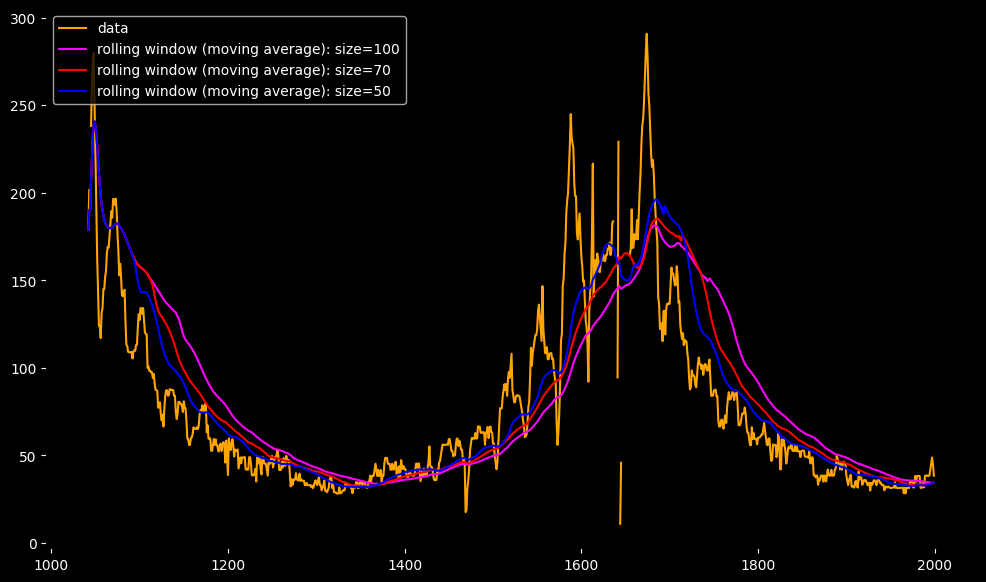

In [161]:
fig, ax = plt.subplots(figsize=(12, 7))

ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]], dists[frames_of_interest[0]: frames_of_interest[-1]],
         color='orange', label='data')
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]],
         dists[frames_of_interest[0]: frames_of_interest[-1]].rolling(100, min_periods=1).mean(),
         color='magenta', label='rolling window (moving average): size=100')
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]],
         dists[frames_of_interest[0]: frames_of_interest[-1]].rolling(70, min_periods=1).mean(),
         color='red', label='rolling window (moving average): size=70')
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]],
         dists[frames_of_interest[0]: frames_of_interest[-1]].rolling(50, min_periods=1).mean(),
         color='blue', label='rolling window (moving average): size=50')
plt.legend()
plt.show()

In [162]:
from scipy.signal import find_peaks

In [163]:
frames_of_interest = (df['frame_id'].iloc[0], df['frame_id'].iloc[-1])

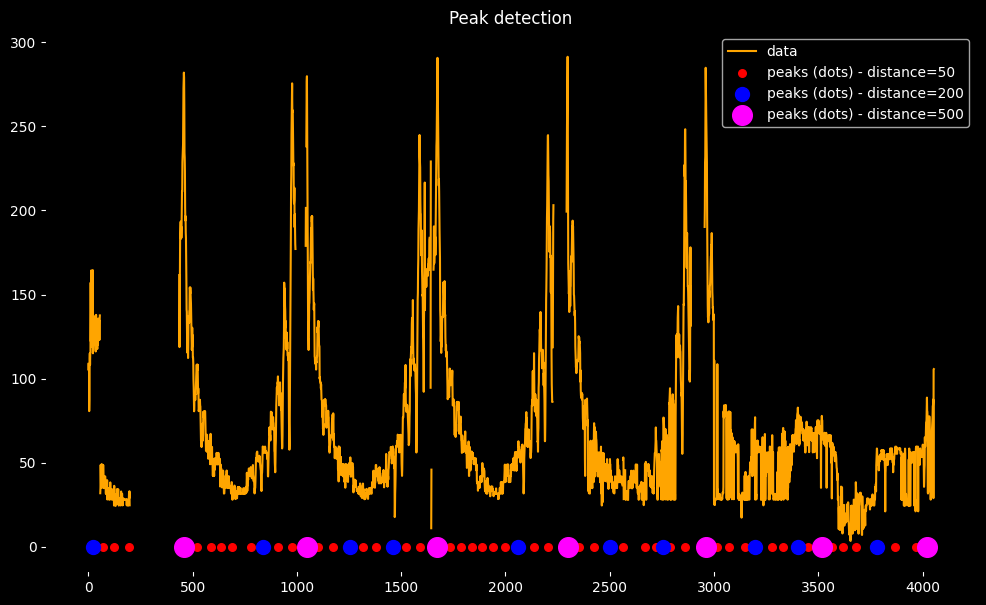

In [164]:
fig, ax = plt.subplots(figsize=(12, 7))
# MANUAL SETTING of distance_between_peaks

#####################################################
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]], dists[frames_of_interest[0]: frames_of_interest[-1]],
         color='orange', label='data')
peaks = find_peaks(dists[frames_of_interest[0]: frames_of_interest[-1]], distance=50)[0]
ax.scatter(
    df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]].iloc[peaks],
    pd.DataFrame(np.zeros_like(df["frame_id"]), index=df["frame_id"]).iloc[peaks],
    label='peaks (dots) - distance=50',
    color='red',
    s=30
)
peaks = find_peaks(dists[frames_of_interest[0]: frames_of_interest[-1]], distance=200)[0]
ax.scatter(
    df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]].iloc[peaks],
    pd.DataFrame(np.zeros_like(df["frame_id"]), index=df["frame_id"]).iloc[peaks],
    label='peaks (dots) - distance=200',
    color='blue',
    s=100
)
peaks = find_peaks(dists[frames_of_interest[0]: frames_of_interest[-1]], distance=500)[0]
ax.scatter(
    df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]].iloc[peaks],
    pd.DataFrame(np.zeros_like(df["frame_id"]), index=df["frame_id"]).iloc[peaks],
    label='peaks (dots) - distance=500',
    color='magenta',
    s=200
)
plt.title('Peak detection')
plt.legend()
plt.show()

<h3> The algorithm seems to be able to detect <font color='orange'>individual steps</font> and <font color='orange'>each pass</font>

In [165]:
from scipy.signal import peak_prominences

In [166]:
frames_of_interest = (df['frame_id'].iloc[0], df['frame_id'].iloc[-1])
#frames_of_interest = (2000, 3000)

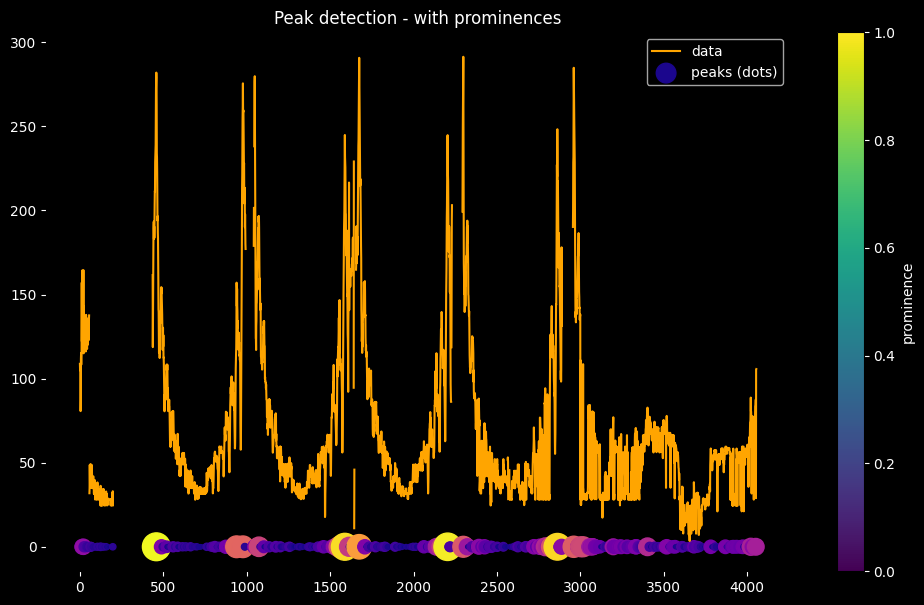

In [167]:
fig, ax = plt.subplots(figsize=(12, 7))
# MANUAL SETTING of distance_between_peaks

peaks = find_peaks(dists[frames_of_interest[0]: frames_of_interest[-1]])[0]
proms = peak_prominences(dists[frames_of_interest[0]: frames_of_interest[-1]], peaks, wlen=None)[0]
colors = mpl.cm.plasma(proms / np.max(proms))

#####################################################
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]], dists[frames_of_interest[0]: frames_of_interest[-1]],
         color='orange', label='data')
temp = ax.scatter(
    df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]].iloc[peaks],
    pd.DataFrame(np.zeros_like(df["frame_id"]), index=df["frame_id"]).iloc[peaks],
    label='peaks (dots)',
    color=colors,
    s=400 * proms / np.max(proms)
)
fig.colorbar(temp, label='prominence')
ax.set_title('Peak detection - with prominences')

plt.legend()
plt.show()

Peaks representing each approach to the camera are the most prominent. <br>
There may be a problem, though:

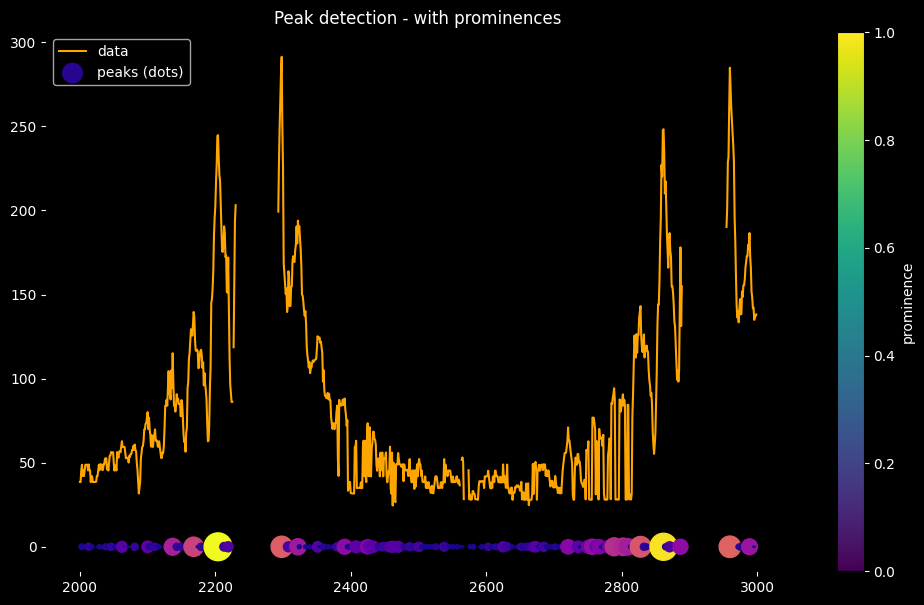

In [168]:
frames_of_interest = (2000, 3000)

fig, ax = plt.subplots(figsize=(12, 7))

peaks = find_peaks(dists[frames_of_interest[0]: frames_of_interest[-1]])[0]
proms = peak_prominences(dists[frames_of_interest[0]: frames_of_interest[-1]], peaks, wlen=None)[0]
colors = mpl.cm.plasma(proms / np.max(proms))

#####################################################
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]], dists[frames_of_interest[0]: frames_of_interest[-1]],
         color='orange', label='data')
temp = ax.scatter(
    df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]].iloc[peaks],
    pd.DataFrame(np.zeros_like(df["frame_id"]), index=df["frame_id"]).iloc[peaks],
    label='peaks (dots)',
    color=colors,
    s=400 * proms / np.max(proms)
)
fig.colorbar(temp, label='prominence')
ax.set_title('Peak detection - with prominences')

plt.legend()
plt.show()

Dots with the highest prominences are not exactly peaks. Those dots come rather too "early" as seen on the plot above. <br>
Let's try to filter those points out anyway

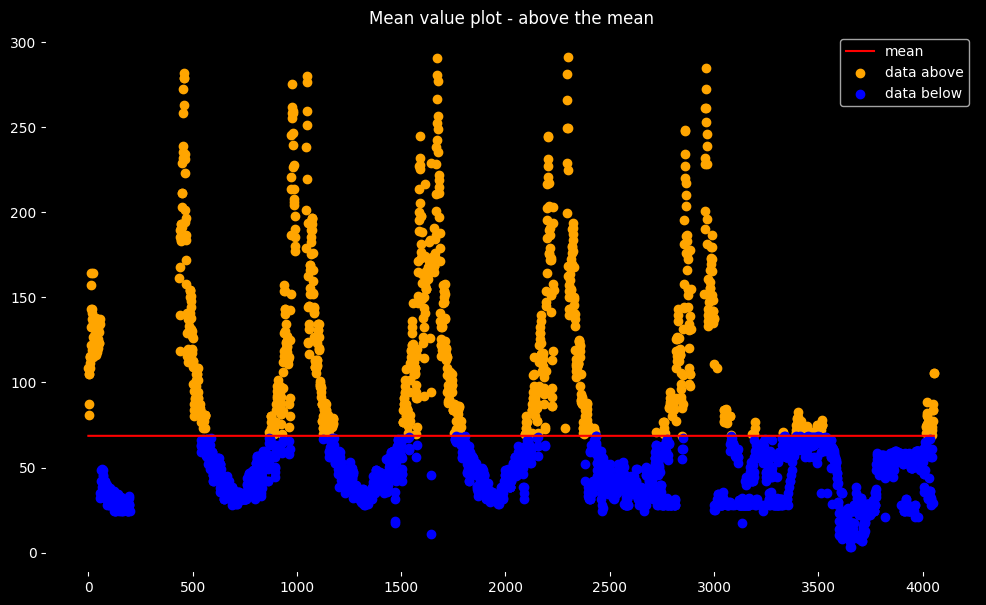

In [169]:
frames_of_interest = (df['frame_id'].iloc[0], df['frame_id'].iloc[-1])

fig, ax = plt.subplots(figsize=(12, 7))


tempdist = dists[frames_of_interest[0]: frames_of_interest[-1]]
#####################################################
mean = np.mean(tempdist[np.isnan(tempdist) == False])
zeros = pd.DataFrame(np.zeros_like(df["frame_id"]), index=df["frame_id"])
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]],
        zeros[frames_of_interest[0]: frames_of_interest[-1]] + mean,
            color='red', label='mean')

ax.scatter(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]][tempdist >= mean], tempdist[tempdist >= mean],
         color='orange', label='data above')
ax.scatter(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]][tempdist < mean], tempdist[tempdist < mean],
         color='blue', label='data below')
fig.colorbar(temp, label='prominence')
ax.set_title('Mean value plot - above the mean')

plt.legend()
plt.show()

Let's take mean one more time

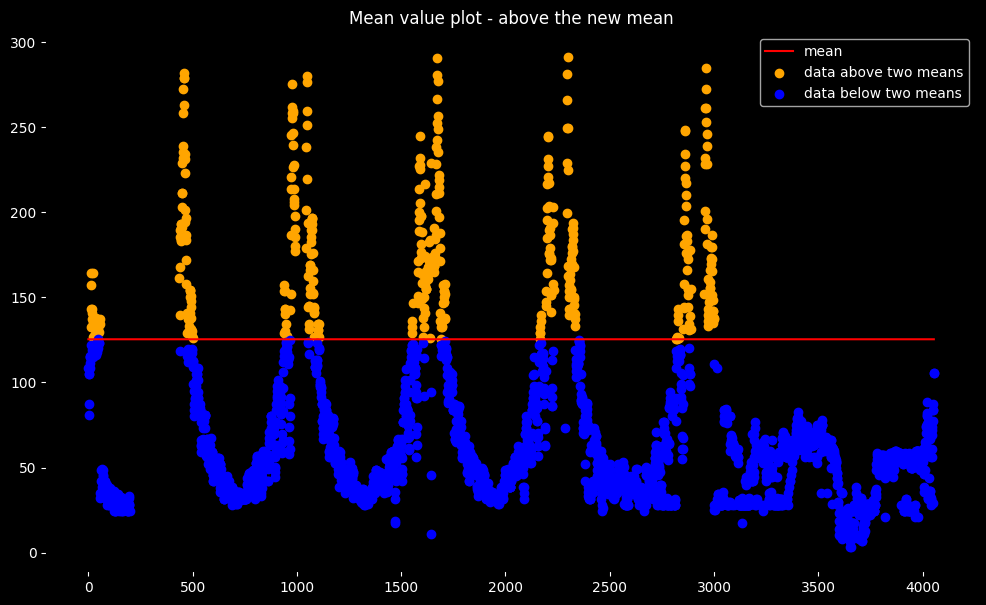

In [170]:
frames_of_interest = (df['frame_id'].iloc[0], df['frame_id'].iloc[-1])

fig, ax = plt.subplots(figsize=(12, 7))

new_ids = df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]][tempdist >= mean]
new_tempdist = tempdist[tempdist >= mean]


tempdist = dists[frames_of_interest[0]: frames_of_interest[-1]]
#####################################################
mean = np.mean(new_tempdist[np.isnan(new_tempdist) == False])
zeros = pd.DataFrame(np.zeros_like(df["frame_id"]), index=df["frame_id"])
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]],
        zeros[frames_of_interest[0]: frames_of_interest[-1]] + mean,
            color='red', label='mean')

ax.scatter(new_ids[new_tempdist >= mean], new_tempdist[new_tempdist >= mean],
         color='orange', label='data above two means')
ax.scatter(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]][tempdist < mean], tempdist[tempdist < mean],
         color='blue', label='data below two means')
fig.colorbar(temp, label='prominence')
ax.set_title('Mean value plot - above the new mean')

plt.legend()
plt.show()

Clearly the approach can be used to calculate optimal distance between peaks for the algorithm. <br>
The data is not clean in the end though, and the peaks are left out with the "two means" approach

In [171]:
### New mean

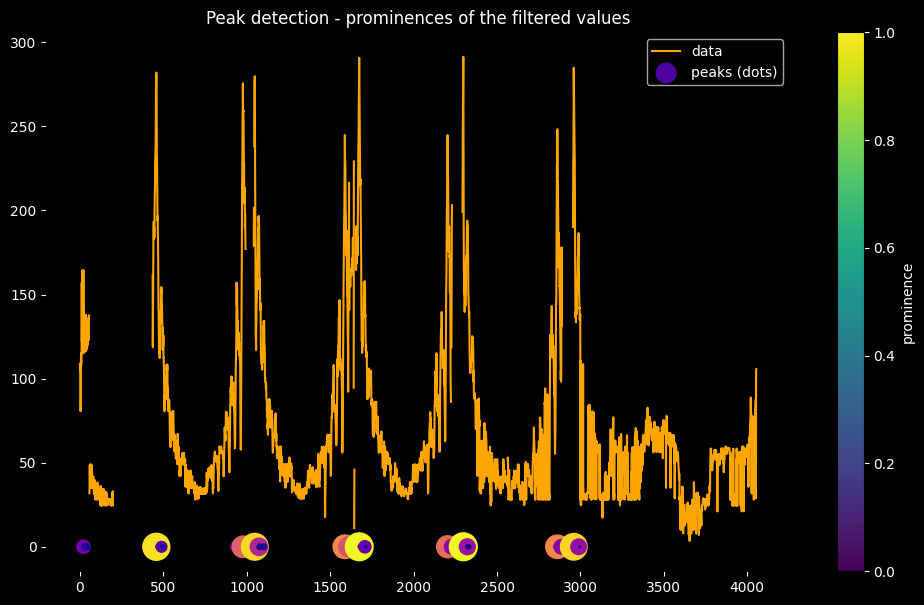

In [172]:
#@title Show code
fig, ax = plt.subplots(figsize=(12, 7))
# MANUAL SETTING of distance_between_peaks

new_dist = dists[frames_of_interest[0]: frames_of_interest[-1]][dists[frames_of_interest[0]: frames_of_interest[-1]] >= mean]
index = new_dist.index

peaks = find_peaks(new_dist)[0]
proms = peak_prominences(new_dist, peaks, wlen=None)[0]
colors = mpl.cm.plasma(proms / np.max(proms))
#####################################################
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]], dists[frames_of_interest[0]: frames_of_interest[-1]],
         color='orange', label='data')

temp = ax.scatter(
    df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]].loc[index].iloc[peaks],
    pd.DataFrame(np.zeros_like(df["frame_id"]), index=df["frame_id"]).loc[index].iloc[peaks],
    label='peaks (dots)',
    color=colors,
    s=400 * proms / np.max(proms)
)
fig.colorbar(temp, label='prominence')
ax.set_title('Peak detection - prominences of the filtered values')

plt.legend()
plt.show()

In [173]:
### Old mean:

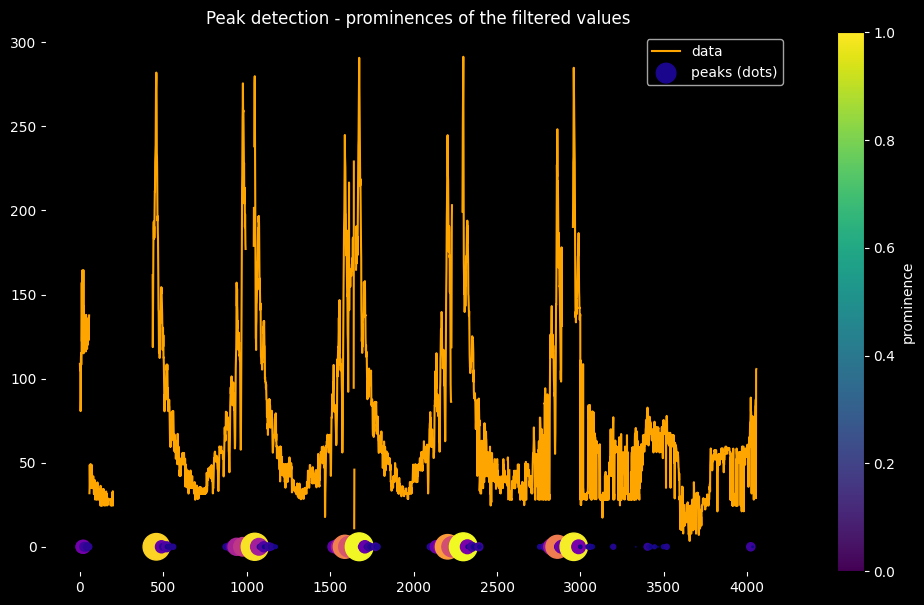

In [174]:
#@title Show code
tempdist = dists[frames_of_interest[0]: frames_of_interest[-1]]
#####################################################
mean = np.mean(tempdist[np.isnan(tempdist) == False])

fig, ax = plt.subplots(figsize=(12, 7))
# MANUAL SETTING of distance_between_peaks

new_dist = dists[frames_of_interest[0]: frames_of_interest[-1]][dists[frames_of_interest[0]: frames_of_interest[-1]] >= mean]
index = new_dist.index

peaks = find_peaks(new_dist)[0]
proms = peak_prominences(new_dist, peaks, wlen=None)[0]
colors = mpl.cm.plasma(proms / np.max(proms))
#####################################################
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]], dists[frames_of_interest[0]: frames_of_interest[-1]],
         color='orange', label='data')

temp = ax.scatter(
    df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]].loc[index].iloc[peaks],
    pd.DataFrame(np.zeros_like(df["frame_id"]), index=df["frame_id"]).loc[index].iloc[peaks],
    label='peaks (dots)',
    color=colors,
    s=400 * proms / np.max(proms)
)
fig.colorbar(temp, label='prominence')
ax.set_title('Peak detection - prominences of the filtered values')

plt.legend()
plt.show()

In [175]:
np.sqrt(np.sum(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]].loc[index].iloc[peaks].diff()**2))

951.7462897222138

Idea: center the peaks using their prominences

In [176]:
pip install statsmodels


[notice] A new release of pip is available: 23.3.1 -> 25.0.1
[notice] To update, run: C:\Users\User\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


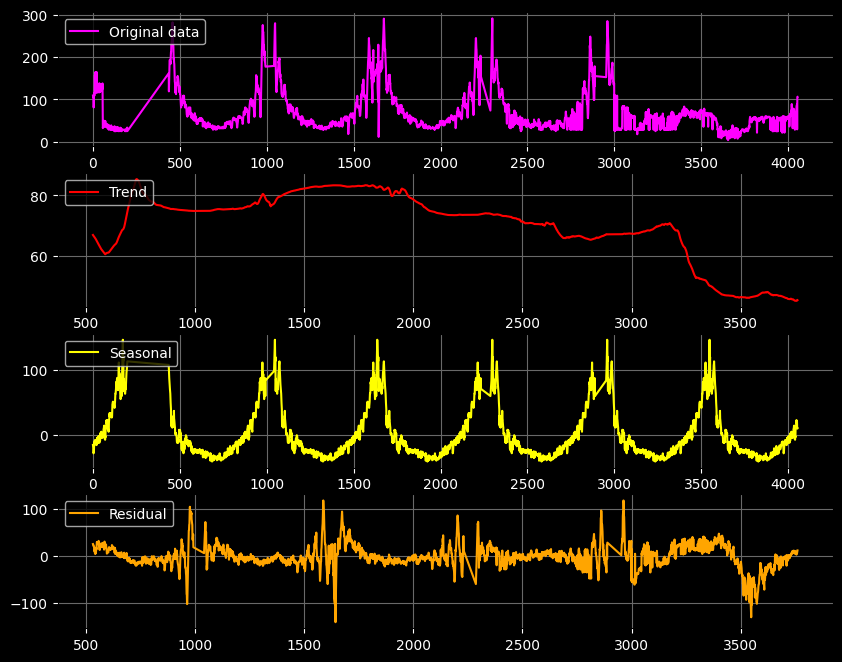

In [177]:
#@title Show code
indexed = dists[frames_of_interest[0]: frames_of_interest[-1]]
indexed = indexed[np.isnan(indexed) == False]

from statsmodels.tsa.seasonal import seasonal_decompose
decomposition = seasonal_decompose(indexed, model='additive', period=589)  # Set manually: going to be different for all objects
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

# Component visualisation
fig, ax = plt.subplots(figsize=(10, 8))
ax.remove()
fig.patch.set_facecolor('black')
ax.set_facecolor('black')

fig = plt.subplot(411)
fig.patch.set_facecolor('black')
plt.plot(indexed, label='Original data', color="magenta")
plt.xticks(color="white")
plt.yticks(color="white")
plt.grid(color="dimgrey")
plt.legend(loc='upper left')

fig = plt.subplot(412)
fig.patch.set_facecolor('black')
plt.plot(trend, label='Trend', color="red")
plt.xticks(color="white")
plt.yticks(color="white")
plt.grid(color="dimgrey")
plt.legend(loc='upper left')

fig = plt.subplot(413)
fig.patch.set_facecolor('black')
plt.plot(seasonal, label='Seasonal', color="yellow")
plt.xticks(color="white")
plt.yticks(color="white")
plt.grid(color="dimgrey")
plt.legend(loc='upper left')

fig = plt.subplot(414)
fig.patch.set_facecolor('black')
plt.plot(residual, label='Residual', color="orange")
plt.xticks(color="white")
plt.yticks(color="white")
plt.grid(color="dimgrey")
plt.legend(loc='upper left')
plt.show()

Note: it is unknown whether the data is expected to be seasonal or not <br>
Here data is not strictly periodic <br>
Hence seasonal analysis is probably <font color = 'red'>not</font> what's optimal

1. An assumption about seasonality is not suitable, easpecially when there's a large number of passes <br>
2. "Arctan" model (custom algorithm) is not suitable, as the assumptions in that model may be too strict <br>
3. From (1) a conclusion can be made: there's not a universal "distance between peaks".

In [178]:
dist_points_to_train_on = ((1, 2))  # Specify 2 points whose data will be used in regression model training
polynomial_degree = 3

# Peak position set manually for now

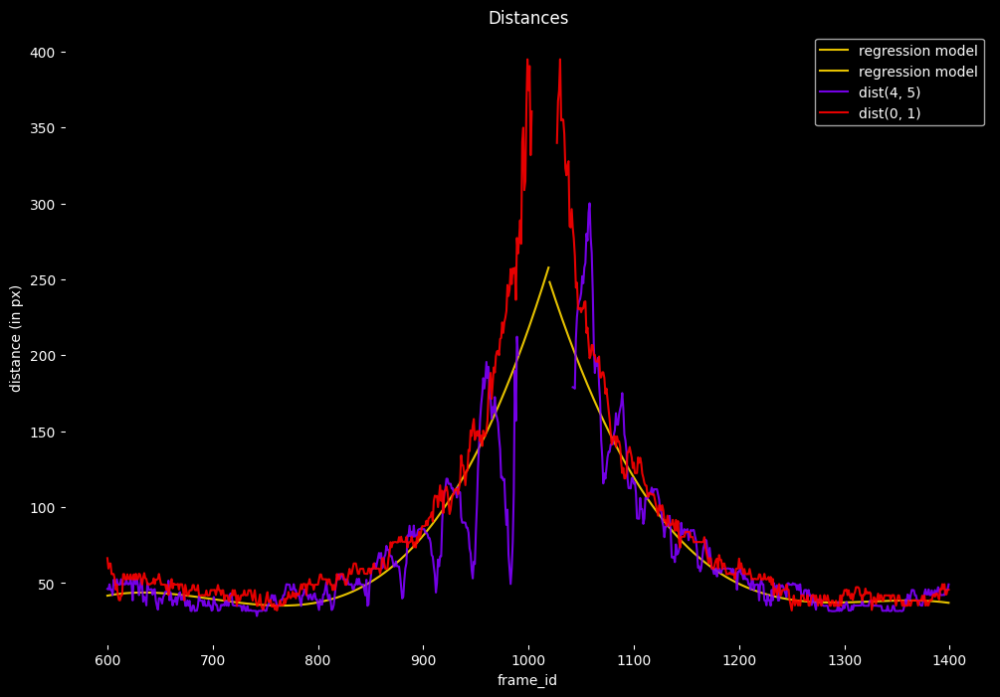

In [179]:
#@title Show code


frames_of_interest = (600, 1400)
peak=1020

points_of_interest = [] # SET MANUALLY by uncommenting the rows or appending manually
points_of_interest.extend([(4, 5), (0, 1)])
#points_of_interest.extend([(2, 1), (1, 0)])  # right leg
#points_of_interest.extend([(3, 4), (4, 5)])  # left leg
#points_of_interest.extend([(2, 5)])  # pelvis


offset_df_columns = 9


fig, ax = plt.subplots(figsize=(12, 8))
ax.set_xlabel('frame_id')
ax.set_ylabel('distance (in px)')
ax.set_title('Distances')
colors = mpl.cm.rainbow(np.linspace(0, 1, len(points_of_interest)))

### Training 1
p0 = dist_points_to_train_on[0]
p1 = dist_points_to_train_on[1]
p0 = f'0{p0 + offset_df_columns}' if p0 + offset_df_columns < 10 else f'{p0 + offset_df_columns}'
p1 = f'0{p1 + offset_df_columns}' if p1 + offset_df_columns < 10 else f'{p1 + offset_df_columns}'
dists = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
        + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)

temp_ids = np.isfinite(df['frame_id']) & np.isfinite(dists)
indx = df.index[(df.index >= frames_of_interest[0]) & (df.index < peak) & temp_ids]
coefs = np.polyfit(df.index[indx], dists[indx], deg=polynomial_degree)
regression = 0
for i in range(0, len(coefs)):
    degree = len(coefs) - 1 - i
    regression += coefs[i] * df.index[(df.index >= frames_of_interest[0]) & (df.index < peak)]**degree

ax.plot(df.index[(df.index >= frames_of_interest[0]) & (df.index < peak)],
        regression, label=f'regression model', color='gold', alpha=0.9)

### Training 2
indx = df.index[(df.index >= peak) & (df.index < frames_of_interest[-1]) & temp_ids]
coefs = np.polyfit(df.index[indx], dists[indx], deg=polynomial_degree)
regression = 0
for i in range(0, len(coefs)):
    degree = len(coefs) - 1 - i
    regression += coefs[i] * df.index[(df.index >= peak) & (df.index < frames_of_interest[-1])]**degree

ax.plot(df.index[(df.index >= peak) & (df.index < frames_of_interest[-1])],
        regression, label=f'regression model', color='gold', alpha=0.9)

### Other code

x_df = -df.filter(regex='x_')
y_df = -df.filter(regex='y_')
c_df = -df.filter(regex='c_')
xdfcp = x_df.iloc[:, 0:25]
ydfcp = y_df.iloc[:, 0:25]

counter = 0
for p0, p1 in points_of_interest:
    # Convert into string format
    p0 = f'0{p0 + offset_df_columns}' if p0 + offset_df_columns < 10 else f'{p0 + offset_df_columns}'
    p1 = f'0{p1 + offset_df_columns}' if p1 + offset_df_columns < 10 else f'{p1 + offset_df_columns}'

    dists = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
        + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)

    ax.plot(df.index[frames_of_interest[0]: frames_of_interest[1]], dists[frames_of_interest[0]: frames_of_interest[1]], color=colors[counter],
            label=f'dist({int(p0) - offset_df_columns}, {int(p1) - offset_df_columns})', alpha=0.9)
    counter += 1

ax.legend()
plt.show()

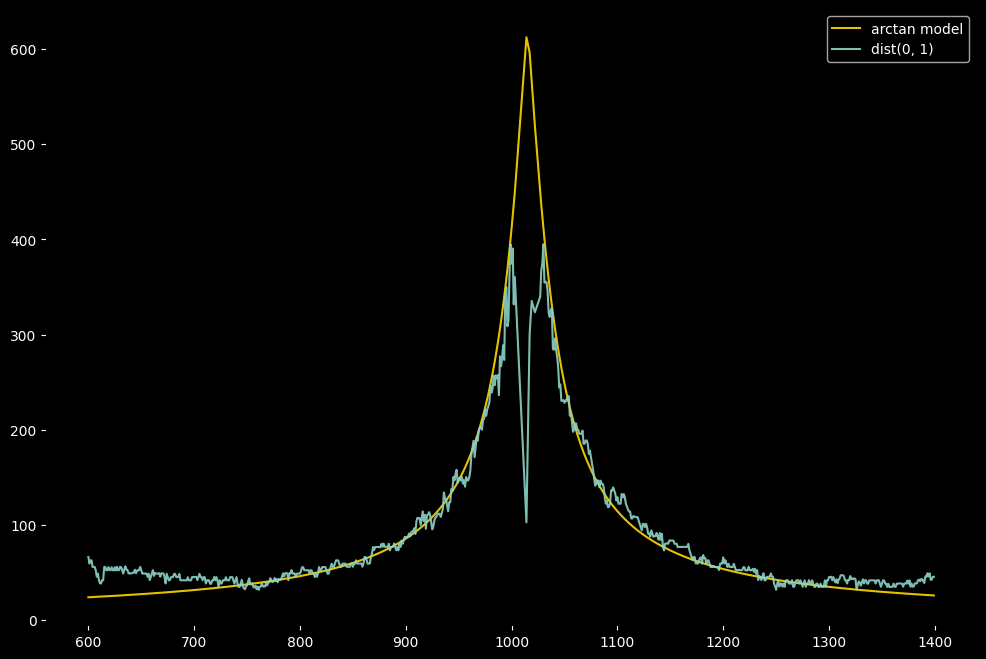

In [180]:
a = 0.04  # peak sharpness
b = 400 # peak height
c = 1015  # asymptote (peak position)
fig, ax = plt.subplots(figsize=(12, 8))

temp_ids = np.isfinite(df['frame_id']) & np.isfinite(dists)
indx = df.index[(df.index >= frames_of_interest[0]) & (df.index < frames_of_interest[-1]) & temp_ids]

ax.plot(df['frame_id'][indx],
        b * np.arctan(1 / np.abs(a * (df['frame_id'][indx] - c))),
         label=f'arctan model', color='gold', alpha=0.9)

ax.plot(df['frame_id'][indx], dists[indx],
            label=f'dist({int(p0) - offset_df_columns}, {int(p1) - offset_df_columns})', alpha=0.9)
plt.legend()
plt.show()

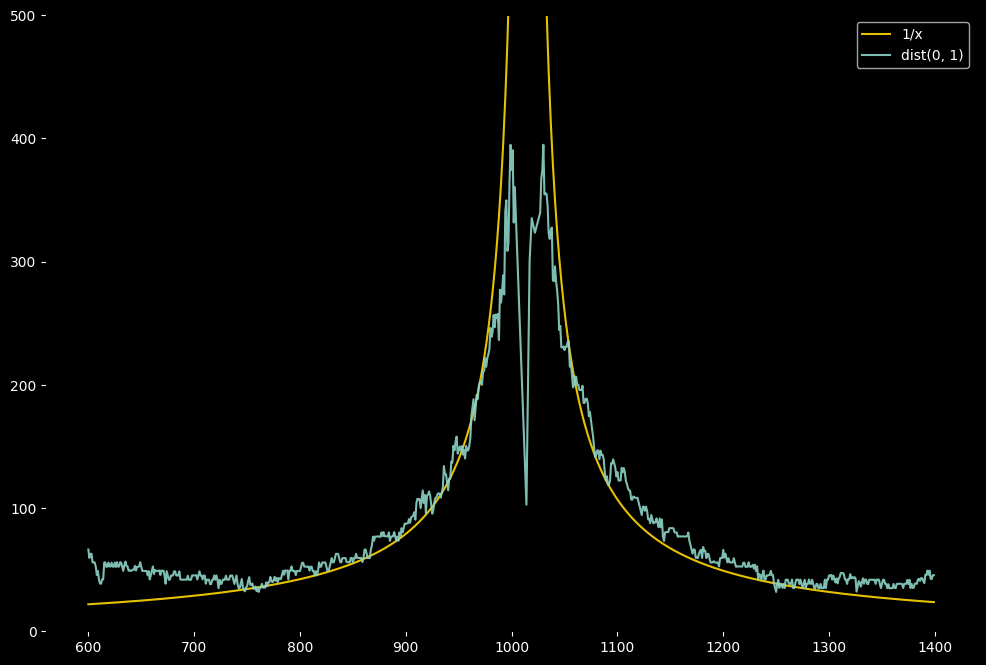

In [181]:
a = 0.11  # peak sharpness
b = 1000 # peak height
c = 1015  # asymptote (peak position)
fig, ax = plt.subplots(figsize=(12, 8))

temp_ids = np.isfinite(df['frame_id']) & np.isfinite(dists)
indx = df.index[(df.index >= frames_of_interest[0]) & (df.index < frames_of_interest[-1]) & temp_ids]

ax.set_ylim(0, 500)
ax.plot(df['frame_id'][indx],
        b / np.abs(a * (df['frame_id'][indx] - c)),
         label=f'1/x', color='gold', alpha=0.9)

ax.plot(df['frame_id'][indx], dists[indx],
            label=f'dist({int(p0) - offset_df_columns}, {int(p1) - offset_df_columns})', alpha=0.9)
plt.legend()
plt.show()

All and all, a rational function should give a good enough approximation. Let's try this approach

In [182]:
'''
def func(x, degree_numerator, degree_denominator, number_of_peaks):

curve = curve_fit(func, df['frame_id'][indx], dists[indx])
'''

"\ndef func(x, degree_numerator, degree_denominator, number_of_peaks):\n\ncurve = curve_fit(func, df['frame_id'][indx], dists[indx])\n"

In [183]:
number_of_peaks = 16

# Sort peaks according to their prominences

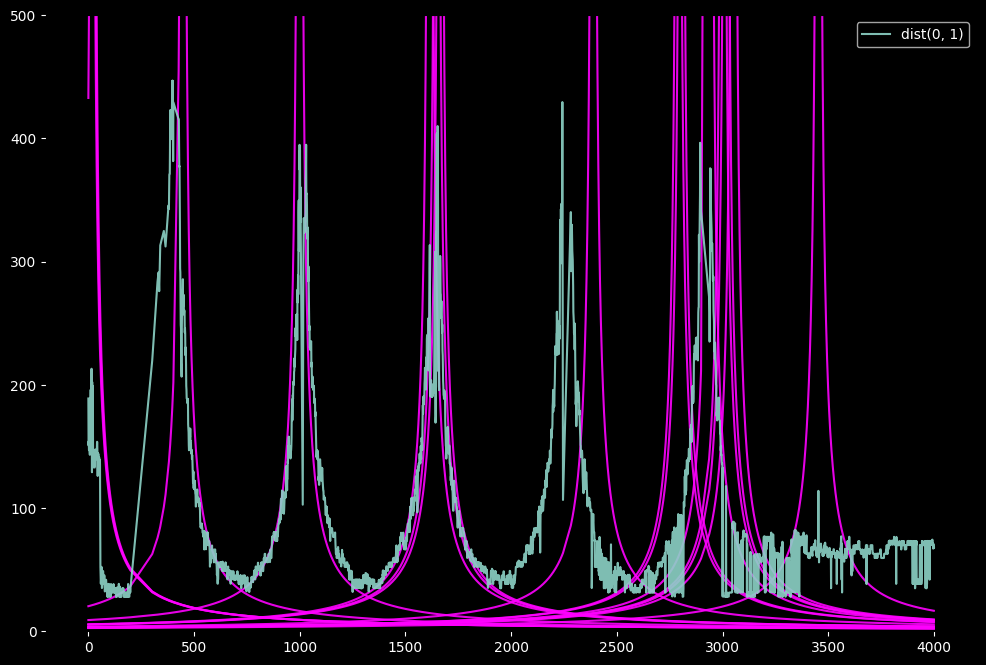

In [184]:
#@title Show code

frames_of_interest = (0, 4000)
peaks = find_peaks(dists[frames_of_interest[0]: frames_of_interest[-1]])[0]
proms = peak_prominences(dists[frames_of_interest[0]: frames_of_interest[-1]], peaks)[0]
sorted_indices = np.argsort(proms)[::-1]  # Sort in descending order
sorted_peaks = peaks[sorted_indices]
sorted_prominences = proms[sorted_indices]


fig, ax = plt.subplots(figsize=(12, 8))
ax.set_ylim(0, 500)

temp_ids = np.isfinite(df['frame_id']) & np.isfinite(dists)
indx = df.index[(df.index >= frames_of_interest[0]) & (df.index < frames_of_interest[-1]) & temp_ids]

for i in range(0, number_of_peaks):
    ax.plot(df['frame_id'][indx],
            b / np.abs(a * (df['frame_id'][indx] - sorted_peaks[i])),
            color='magenta', alpha=0.9)

ax.plot(df['frame_id'][indx], dists[indx],
            label=f'dist({int(p0) - offset_df_columns}, {int(p1) - offset_df_columns})', alpha=0.9)
plt.legend()
plt.show()

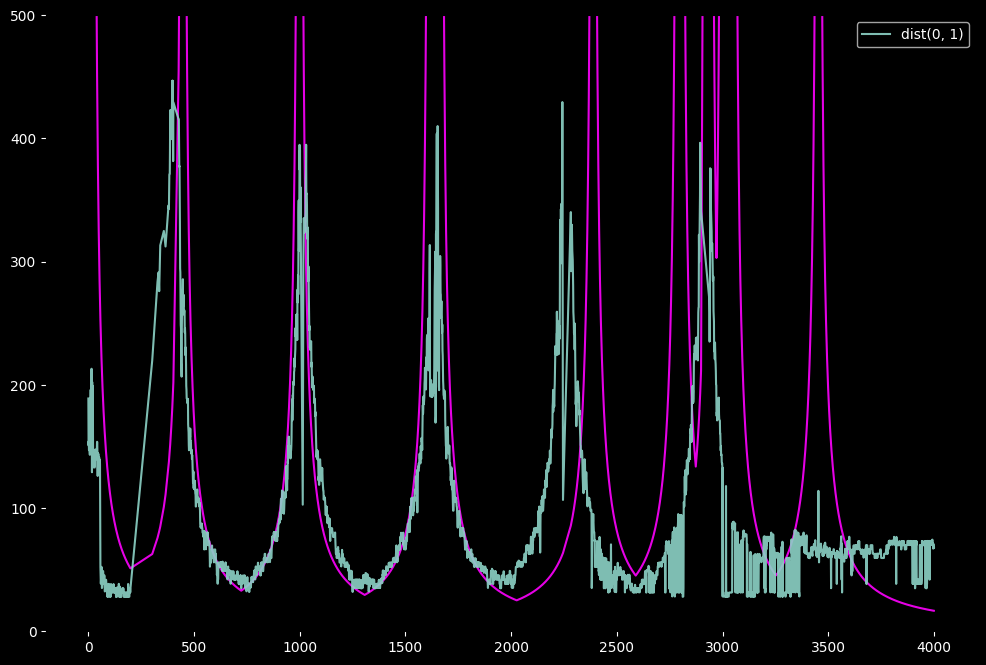

In [185]:
#@title Show code

a = 0.11  # peak sharpness
b = 1000 # peak height
c = 1015  # asymptote (peak position)

peaks = find_peaks(dists[frames_of_interest[0]: frames_of_interest[-1]])[0]
proms = peak_prominences(dists[frames_of_interest[0]: frames_of_interest[-1]], peaks)[0]
sorted_indices = np.argsort(proms)[::-1]  # Sort in descending order
sorted_peaks = peaks[sorted_indices]
sorted_prominences = proms[sorted_indices]


fig, ax = plt.subplots(figsize=(12, 8))
ax.set_ylim(0, 500)

temp_ids = np.isfinite(df['frame_id']) & np.isfinite(dists)
indx = df.index[(df.index >= frames_of_interest[0]) & (df.index < frames_of_interest[-1]) & temp_ids]

vals = []
for i in range(0, number_of_peaks):
    vals.append(b / np.abs(a * (df['frame_id'][indx] - sorted_peaks[i])))
vals = np.array(vals)

ax.plot(df['frame_id'][indx],
        np.max(vals, axis=0),
        color='magenta', alpha=0.9)

ax.plot(df['frame_id'][indx], dists[indx],
            label=f'dist({int(p0) - offset_df_columns}, {int(p1) - offset_df_columns})', alpha=0.9)
plt.legend()
plt.show()


In [186]:
print(r2_score(dists[indx][np.isfinite(np.max(vals, axis=0))], np.max(vals, axis=0)[np.isfinite(np.max(vals, axis=0))]))

-199.32728464787925


r2_score too low => More parameters needed for the model

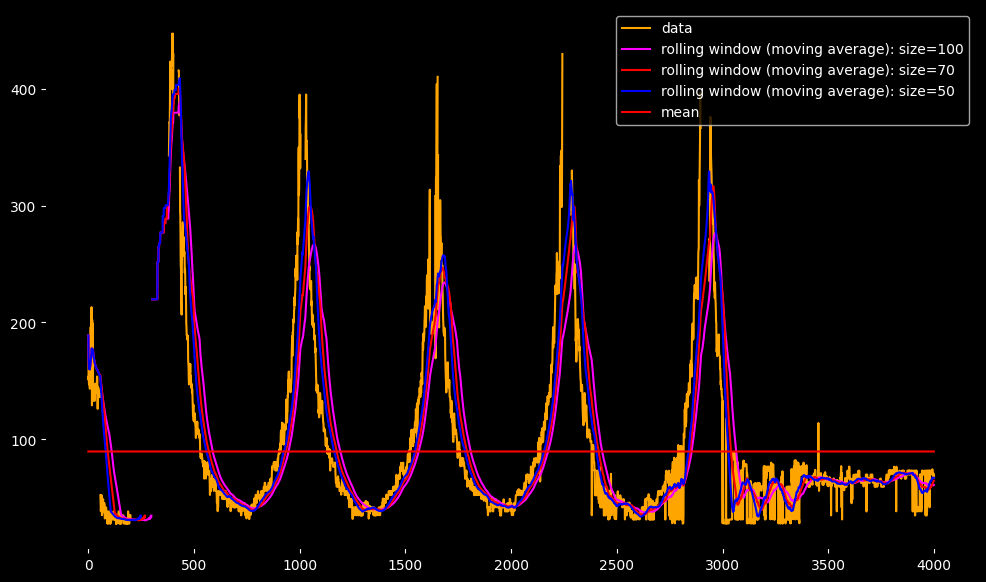

In [187]:
fig, ax = plt.subplots(figsize=(12, 7))

ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]], dists[frames_of_interest[0]: frames_of_interest[-1]],
         color='orange', label='data')
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]],
         dists[frames_of_interest[0]: frames_of_interest[-1]].rolling(100, min_periods=1).mean(),
         color='magenta', label='rolling window (moving average): size=100')
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]],
         dists[frames_of_interest[0]: frames_of_interest[-1]].rolling(70, min_periods=1).mean(),
         color='red', label='rolling window (moving average): size=70')
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]],
         dists[frames_of_interest[0]: frames_of_interest[-1]].rolling(50, min_periods=1).mean(),
         color='blue', label='rolling window (moving average): size=50')

tempdist = dists[frames_of_interest[0]: frames_of_interest[-1]]
#####################################################
mean = np.mean(tempdist[np.isnan(tempdist) == False])
zeros = pd.DataFrame(np.zeros_like(df["frame_id"]), index=df["frame_id"])
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]],
        zeros[frames_of_interest[0]: frames_of_interest[-1]] + mean,
            color='red', label='mean')
plt.legend()
plt.show()

Let's use the information about the number of times the moving average crosses the mean value to determine the positions of all major peaks and lows. <br>
This way, one problem is solved - anomalies, so one outlier wouldn't give peaks <br>

The only issue is to determine the size of the rolling window

Again, for reference <br>
<img src="https://raw.githubusercontent.com/oscar-foxtrot/Coxarthrosis-research/main/images/hips_03.png">

In [188]:
frames_of_interest = (1050, 1400)
dist_points = (2, 5)

offset_df_columns = 9
p0 = dist_points[0]
p1 = dist_points[1]
p0 = f'0{p0 + offset_df_columns}' if p0 + offset_df_columns < 10 else f'{p0 + offset_df_columns}'
p1 = f'0{p1 + offset_df_columns}' if p1 + offset_df_columns < 10 else f'{p1 + offset_df_columns}'
dists = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
        + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)

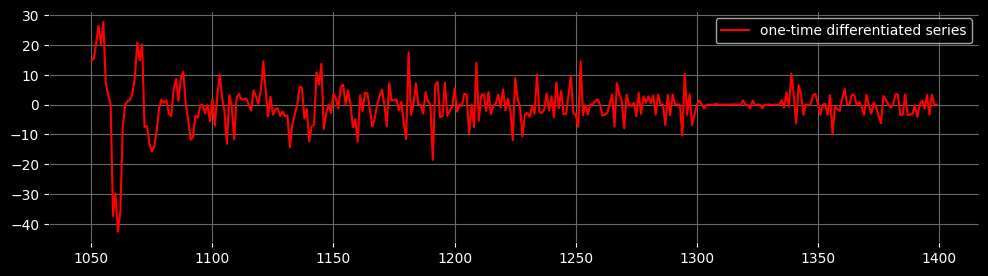

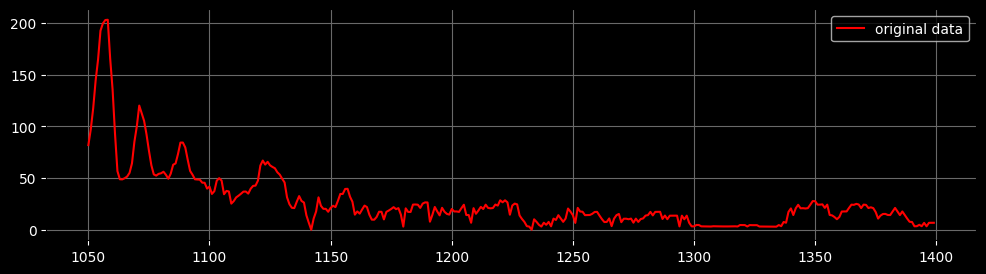

In [189]:
idx = df['frame_id'][frames_of_interest[0]: frames_of_interest[-1]].index

fig, ax = plt.subplots(figsize=(12, 3))
ax.plot(df['frame_id'][idx], dists.diff()[idx], color='red', label='one-time differentiated series')
ax.grid(color='dimgrey')
ax.legend()
fig, ax = plt.subplots(figsize=(12, 3))
ax.plot(df['frame_id'][idx], dists[idx], color='red', label='original data')
ax.grid(color='dimgrey')
ax.legend()
plt.show()

In [190]:
from scipy.signal import spectrogram

In [191]:
dist_points = (1, 4)

offset_df_columns = 9
p0 = dist_points[0]
p1 = dist_points[1]
p0 = f'0{p0 + offset_df_columns}' if p0 + offset_df_columns < 10 else f'{p0 + offset_df_columns}'
p1 = f'0{p1 + offset_df_columns}' if p1 + offset_df_columns < 10 else f'{p1 + offset_df_columns}'
dists = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
        + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)

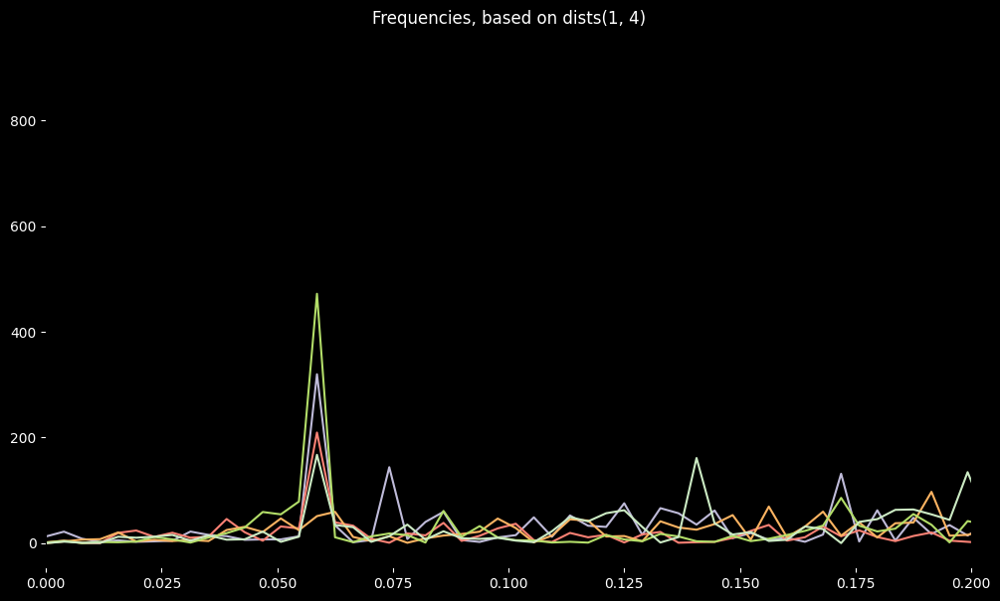

In [192]:
spectrum = spectrogram(dists[0:3000].diff())
fig, ax = plt.subplots(figsize=(12, 7))
ax.set_xlim(0, 0.2)
ax.plot(spectrum[0], spectrum[2])
ax.set_title(f'Frequencies, based on dists({int(p0) - offset_df_columns}, {int(p1) - offset_df_columns})')
plt.show()

In [193]:
dist_points = (2, 3)

offset_df_columns = 9
p0 = dist_points[0]
p1 = dist_points[1]
p0 = f'0{p0 + offset_df_columns}' if p0 + offset_df_columns < 10 else f'{p0 + offset_df_columns}'
p1 = f'0{p1 + offset_df_columns}' if p1 + offset_df_columns < 10 else f'{p1 + offset_df_columns}'
dists = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
        + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)


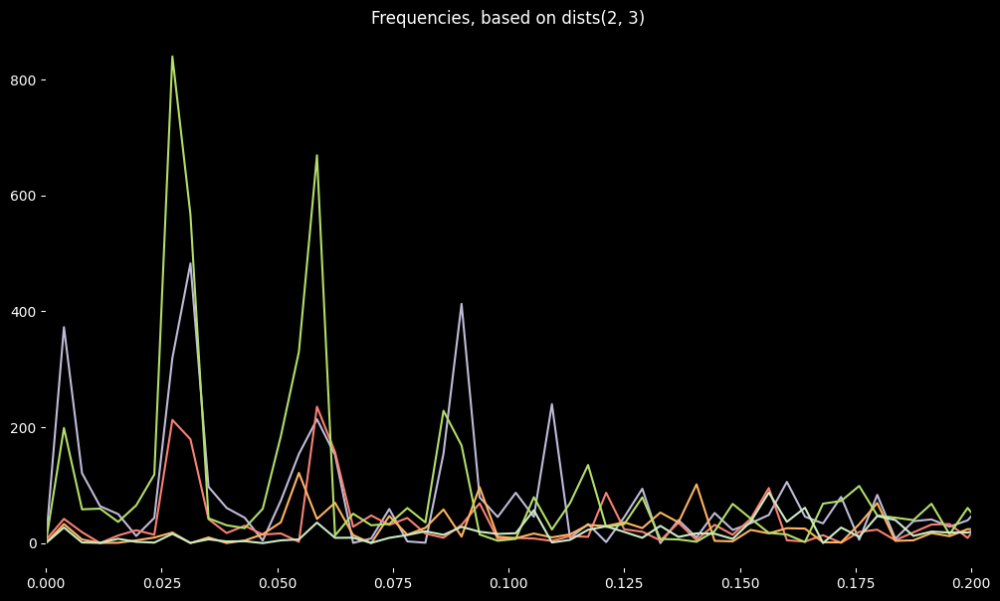

In [194]:
spectrum = spectrogram(dists[0:3000].diff())
fig, ax = plt.subplots(figsize=(12, 7))
ax.set_xlim(0, 0.2)
ax.plot(spectrum[0], spectrum[2])
ax.set_title(f'Frequencies, based on dists({int(p0) - offset_df_columns}, {int(p1) - offset_df_columns})')
plt.show()

In [195]:
np.nanmax(spectrum[2])

839.8424581440925

Najafi B, Aminian K, Paraschiv-Ionescu A, Loew F, Bula CJ, Robert P. Ambulatory system for
human motion analysis using a kinematic sensor: monitoring of daily physical activity in the elderly.
IEEE transactions on bio-medical engineering. 2003;50:711-23 <br> <br>

citation -> Step time is 0.25-2.25 sec <br> <br>

The camera used during the recording session had an FPS setting of 30 => 1 frame ~ 0.03333(3) sec <br> =>

Formula for period: T = 1/v, T - period, v - frequency <br>
T_seconds = T_frames / FPS = 1/(v_frames*FPS) <br>
=> v_frames = 1 / (T_seconds * FPS) => <br>
FPS=30 => v_frames must be in \[0.0148, 0.13333\]

In [196]:
fps = 30
# (0.014815, 0.1333333333)

In [197]:
spectrum = spectrogram(dists[0:3000].diff())

In [198]:
print(np.max(spectrum[2][np.isnan(spectrum[2]) == False]))

839.8424581440925


In [199]:
arg = np.nanargmax(spectrum[2])

In [200]:
spectrum[2].shape

(129, 13)

In [201]:
mask = np.any(spectrum[2] == np.nanmax(spectrum[2]), axis=1)

In [202]:
freq = spectrum[0][mask][0]

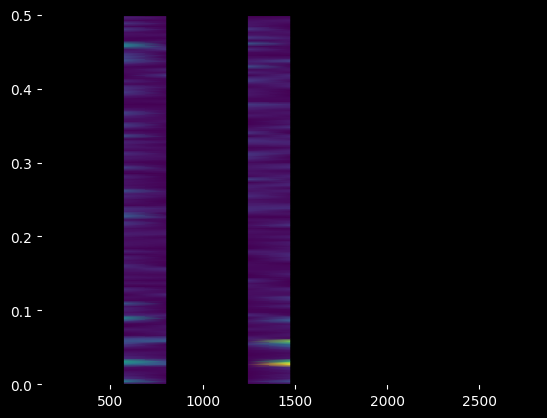

In [203]:
plt.pcolormesh(spectrum[1], spectrum[0], spectrum[2], shading='gouraud')
plt.show()

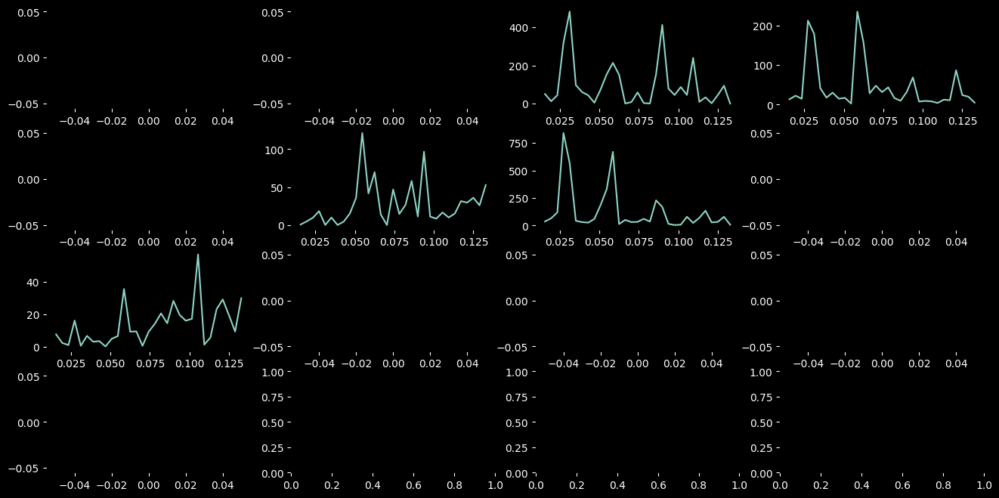

In [204]:
fig, axs = plt.subplots(4, 4, figsize=(16, 8))
for i in range(0, 13):
    axs[i // 4][i % 4].plot(spectrum[0][(spectrum[0] >= 0.014815) & (spectrum[0] < 0.1333333333)], spectrum[2][:, i][(spectrum[0] >= 0.014815) & (spectrum[0] < 0.1333333333)])

In [205]:
print(freq)  # Frequency for a right stride + left stride

0.02734375


In [206]:
print(1 / freq)  # period (frames)

36.57142857142857


Individual steps / strides can be detected well

In [207]:
# If limp then step detection might be wrong ?

Now using this information, we get a rolling window of size equal to 3 right + 3 left strides

In [208]:
stride_time = 1 / freq

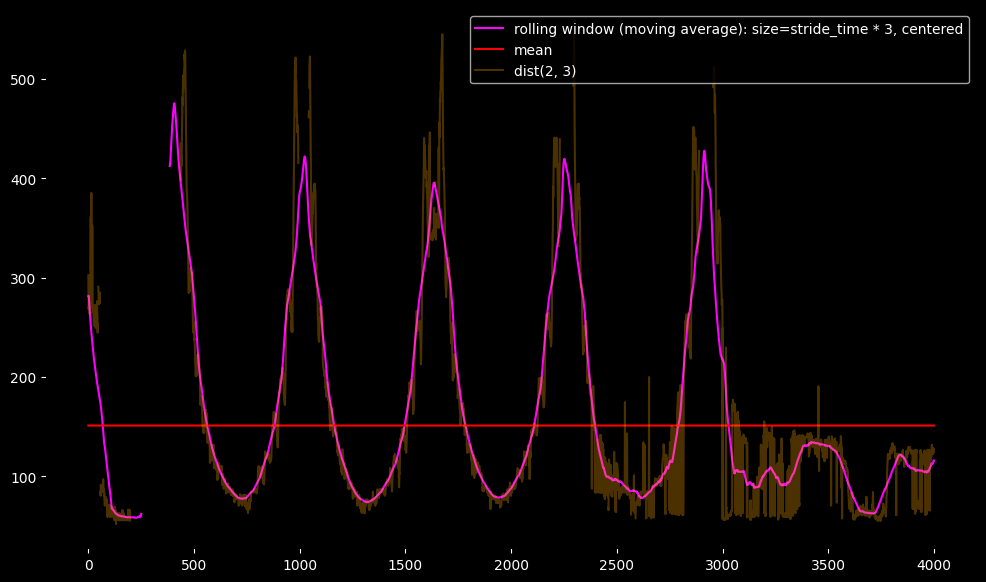

In [209]:
dist_points = (2, 3)

offset_df_columns = 9
p0 = dist_points[0]
p1 = dist_points[1]
p0 = f'0{p0 + offset_df_columns}' if p0 + offset_df_columns < 10 else f'{p0 + offset_df_columns}'
p1 = f'0{p1 + offset_df_columns}' if p1 + offset_df_columns < 10 else f'{p1 + offset_df_columns}'
dists = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
        + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)

fig, ax = plt.subplots(figsize=(12, 7))
frames_of_interest = (0, 4000)

ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]],
         dists[frames_of_interest[0]: frames_of_interest[-1]].rolling(int(np.round(stride_time * 3)), min_periods=4, center=True).mean(),
         color='magenta', label='rolling window (moving average): size=stride_time * 3, centered')

tempdist = dists[frames_of_interest[0]: frames_of_interest[-1]]
#####################################################
mean = np.mean(tempdist[np.isnan(tempdist) == False])
zeros = pd.DataFrame(np.zeros_like(df["frame_id"]), index=df["frame_id"])
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]],
        zeros[frames_of_interest[0]: frames_of_interest[-1]] + mean,
        color='red', label='mean')
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]], dists[frames_of_interest[0]: frames_of_interest[-1]],
         color='orange', label=f'dist({int(p0) - offset_df_columns}, {int(p1) - offset_df_columns})', alpha=0.3)
plt.legend()
plt.show()

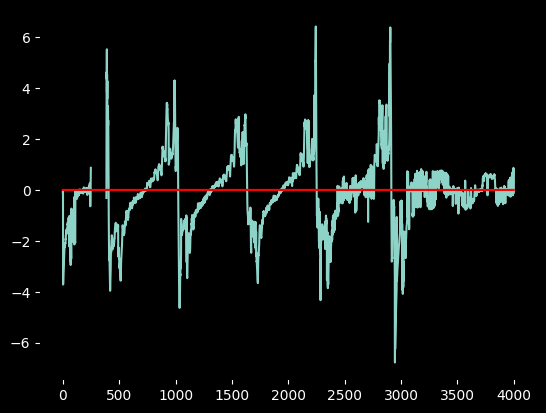

In [210]:
frames_of_interest = (0, 4000)

fig, ax = plt.subplots()
ax.plot(
    df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]],
    dists[frames_of_interest[0]: frames_of_interest[-1]].rolling(int(np.round(stride_time * 3)), min_periods=5, center=True).mean().diff()
)
zeros = pd.DataFrame(np.zeros_like(df["frame_id"]), index=df["frame_id"])
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]],
        zeros[frames_of_interest[0]: frames_of_interest[-1]],
        color='red', label='zero-line')
plt.show()

Assumptions: there can be only one peak and only one trough within a time interval of 3 full strides (centered at the point). <br>
Points of the same type must be some distance away from each other

In [211]:
rollin = dists[frames_of_interest[0]: frames_of_interest[-1]].rolling(int(np.round(stride_time * 3)), min_periods=4, center=True).mean().diff()

In [212]:
troughs = np.where((rollin.iloc[: -1] <= 0).values & (rollin.iloc[1: ] >= 0).values)[0]

In [213]:
troughs

array([   1,  144,  146,  156,  159,  163,  178,  182,  185,  188,  195,
        202,  209,  213,  218,  223,  225,  230,  237,  245,  387,  721,
        729,  738,  742, 1306, 1312, 1317, 1320, 1322, 1938, 1945, 2436,
       2451, 2457, 2460, 2470, 2477, 2481, 2489, 2492, 2498, 2500, 2503,
       2508, 2513, 2514, 2517, 2548, 2551, 2566, 2568, 2573, 2576, 2578,
       2589, 2597, 2604, 2614, 2616, 2621, 2637, 2676, 2681, 2687, 2693,
       2702, 2708, 2725, 2730, 2742, 2754, 2761, 3055, 3057, 3077, 3081,
       3092, 3096, 3099, 3115, 3118, 3124, 3128, 3131, 3138, 3144, 3150,
       3152, 3155, 3159, 3164, 3172, 3192, 3210, 3213, 3219, 3221, 3228,
       3253, 3256, 3259, 3277, 3280, 3284, 3286, 3290, 3295, 3298, 3309,
       3335, 3384, 3388, 3398, 3406, 3410, 3416, 3424, 3428, 3440, 3447,
       3461, 3469, 3481, 3483, 3491, 3502, 3511, 3568, 3620, 3653, 3655,
       3662, 3674, 3682, 3685, 3694, 3699, 3705, 3712, 3718, 3720, 3767,
       3854, 3876, 3878, 3881, 3888, 3896, 3898, 39

In [214]:
peaks = np.where((rollin.iloc[: -1] >= 0).values & (rollin.iloc[1: ] <= 0).values)[0]

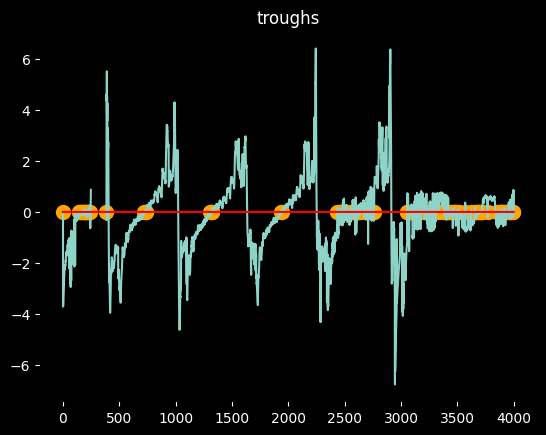

In [215]:
frames_of_interest = (0, 4000)

fig, ax = plt.subplots()
ax.plot(
    df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]],
    dists[frames_of_interest[0]: frames_of_interest[-1]].rolling(int(np.round(stride_time * 3)), min_periods=5, center=True).mean().diff()
)
zeros = pd.DataFrame(np.zeros_like(df["frame_id"]), index=df["frame_id"])
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]],
        zeros[frames_of_interest[0]: frames_of_interest[-1]],
        color='red', label='zero-line')
ax.scatter(troughs, np.zeros((len(troughs),)), s=100, color='orange')
ax.set_title('troughs')
plt.show()

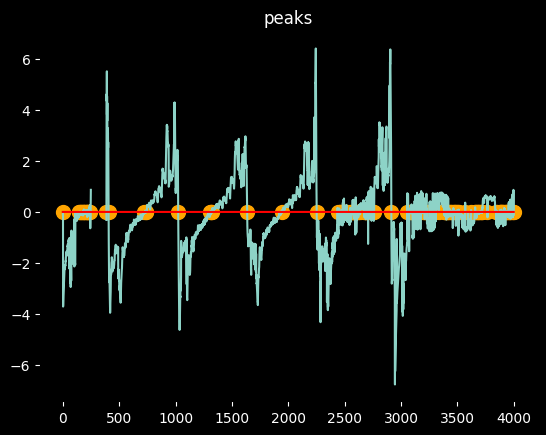

In [216]:
frames_of_interest = (0, 4000)

fig, ax = plt.subplots()
ax.plot(
    df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]],
    dists[frames_of_interest[0]: frames_of_interest[-1]].rolling(int(np.round(stride_time * 3)), min_periods=5, center=True).mean().diff()
)
zeros = pd.DataFrame(np.zeros_like(df["frame_id"]), index=df["frame_id"])
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]],
        zeros[frames_of_interest[0]: frames_of_interest[-1]],
        color='red', label='zero-line')
ax.scatter(peaks, np.zeros((len(peaks),)), s=100, color='orange')
ax.set_title('peaks')
plt.show()

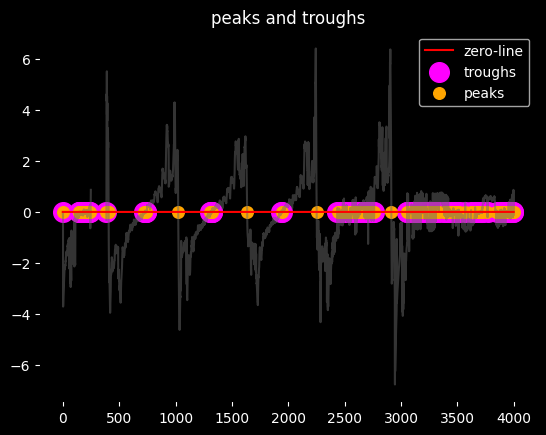

In [217]:
frames_of_interest = (0, 4000)

fig, ax = plt.subplots()
ax.plot(
    df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]],
    dists[frames_of_interest[0]: frames_of_interest[-1]].rolling(int(np.round(stride_time * 3)), min_periods=5, center=True).mean().diff(),
    color='dimgrey',
    alpha=0.5
)
zeros = pd.DataFrame(np.zeros_like(df["frame_id"]), index=df["frame_id"])
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]],
        zeros[frames_of_interest[0]: frames_of_interest[-1]],
        color='red', label='zero-line')
ax.scatter(troughs, np.zeros((len(troughs),)), s=200, color='magenta', label='troughs', alpha=1)
ax.scatter(peaks, np.zeros((len(peaks),)), s=70, color='orange', label='peaks', alpha=1)
ax.set_title('peaks and troughs')
ax.legend()
plt.show()

A stronger filtering method needed: <br>

In [218]:
movin = dists[frames_of_interest[0]: frames_of_interest[-1]].rolling(int(np.round(stride_time * 3)), min_periods=4, center=True).mean()

tempdist = dists[frames_of_interest[0]: frames_of_interest[-1]]
#####################################################
mean = np.mean(tempdist[np.isnan(tempdist) == False])
peaks = find_peaks(movin, height=(mean, None))[0]
troughs = find_peaks(-movin, height=(None, mean))[0]

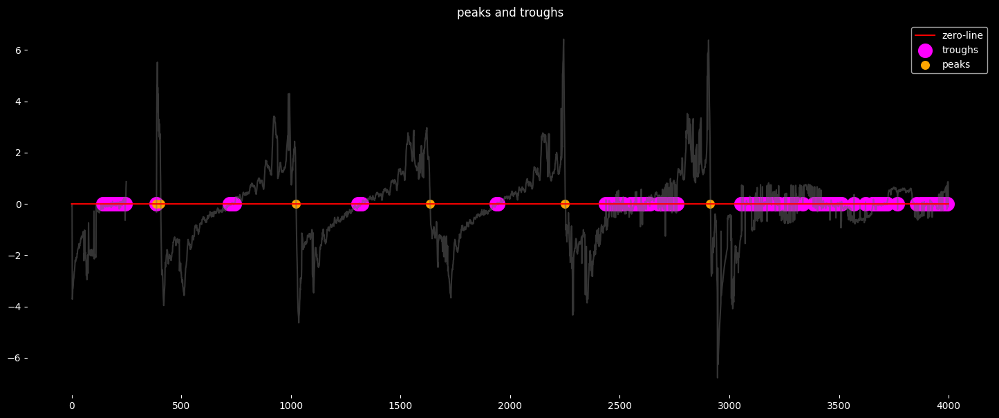

In [219]:
frames_of_interest = (0, 4000)

fig, ax = plt.subplots(figsize=(18, 7))
ax.plot(
    df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]],
    dists[frames_of_interest[0]: frames_of_interest[-1]].rolling(int(np.round(stride_time * 3)), min_periods=5, center=True).mean().diff(),
    color='dimgrey',
    alpha=0.5
)
zeros = pd.DataFrame(np.zeros_like(df["frame_id"]), index=df["frame_id"])
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]],
        zeros[frames_of_interest[0]: frames_of_interest[-1]],
        color='red', label='zero-line')
ax.scatter(troughs, np.zeros((len(troughs),)), s=200, color='magenta', label='troughs', alpha=1)
ax.scatter(peaks, np.zeros((len(peaks),)), s=70, color='orange', label='peaks', alpha=1)
ax.set_title('peaks and troughs')
ax.legend()
plt.show()

That's better

In [220]:
distance_setting = 6 * stride_time  # SET THE MULTIPLIER MANUALLY
print(distance_setting)

219.42857142857142


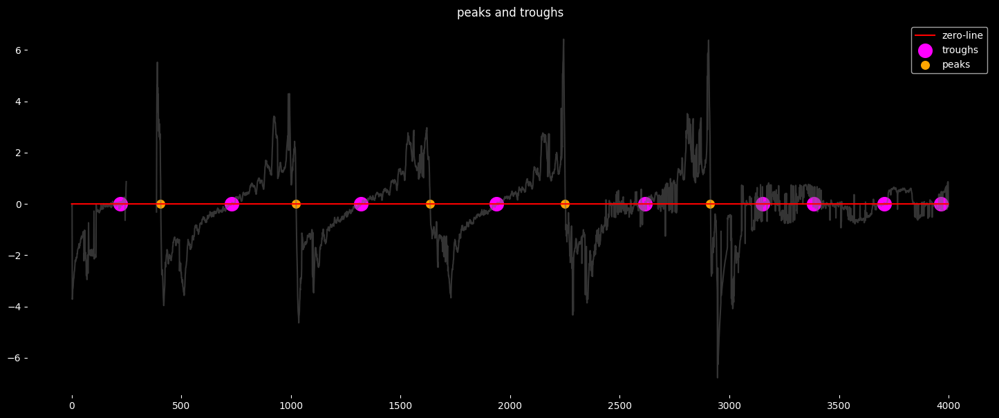

In [221]:
frames_of_interest = (0, 4000)

movin = dists[frames_of_interest[0]: frames_of_interest[-1]].rolling(int(np.round(stride_time * 3)), min_periods=4, center=True).mean()

tempdist = dists[frames_of_interest[0]: frames_of_interest[-1]]
#####################################################
mean = np.mean(tempdist[np.isnan(tempdist) == False])
peaks = find_peaks(movin, height=(mean, None), distance=distance_setting)[0]
troughs = find_peaks(-movin, height=(None, mean), distance=distance_setting)[0]

fig, ax = plt.subplots(figsize=(18, 7))
ax.plot(
    df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]],
    dists[frames_of_interest[0]: frames_of_interest[-1]].rolling(int(np.round(stride_time * 3)), min_periods=5, center=True).mean().diff(),
    color='dimgrey',
    alpha=0.5
)
zeros = pd.DataFrame(np.zeros_like(df["frame_id"]), index=df["frame_id"])
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]],
        zeros[frames_of_interest[0]: frames_of_interest[-1]],
        color='red', label='zero-line')
ax.scatter(troughs, np.zeros((len(troughs),)), s=200, color='magenta', label='troughs', alpha=1)
ax.scatter(peaks, np.zeros((len(peaks),)), s=70, color='orange', label='peaks', alpha=1)
ax.set_title('peaks and troughs')
ax.legend()
plt.show()

<h3>Couple more experiments</h3>

In [222]:
from scipy.optimize import minimize

In [223]:
epsilon = 0.00005
'''
def func(x, a, b):
    global center
    return b * np.arctan(1 / np.abs(a * (x - center)))
'''
def func(x, a, b, c):
    global center
    return b * np.arctan(c / np.abs(a * (x - epsilon - center)))

def func2(x, a, b):
    global center
    return a * np.exp(-b * abs(x - center))

def func3(x, a, b, c, d, e):
    global center
    return b * np.arctan(c / np.abs(a * (x + epsilon - center))) + d * np.exp(-e * abs(x - center))

def func4(x, a, b, c, d, e):
    return a + b*x + c*x**2 + d*x**3 + e*x**4

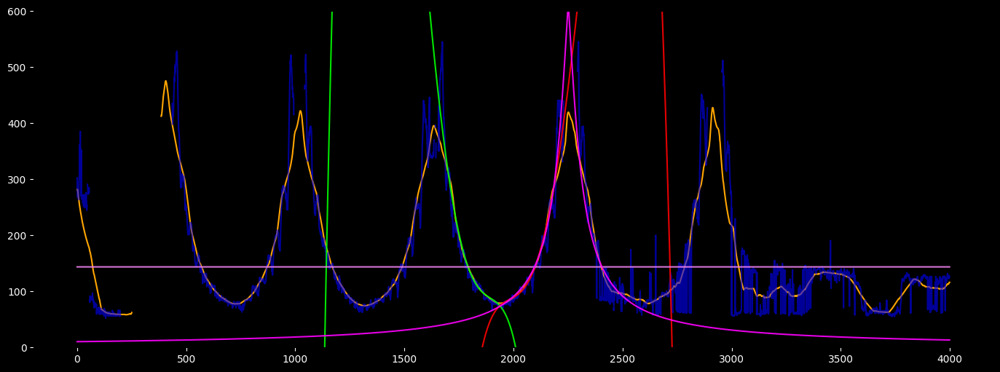

In [224]:
#@title Show code
fig, ax = plt.subplots(figsize=(17, 6))
leave_dist_to_peak = int(stride_time * 1.5)

temp_ids = np.isfinite(df['frame_id']) & np.isfinite(movin)
indx = df.index[(df.index >= frames_of_interest[0]) & (df.index < frames_of_interest[-1]) & temp_ids]


ax.set_ylim(0, 600)
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]], movin[frames_of_interest[0]: frames_of_interest[-1]],
         color='orange', label='moving average')
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]], dists[frames_of_interest[0]: frames_of_interest[-1]],
         color='blue', label='data', alpha=0.6)

'''
for i in range(1, len(peaks)):
    center = peaks[i]
    curve = curve_fit(func, df['frame_id'][indx].loc[troughs[i]: peaks[i] - leave_dist_to_peak], movin[indx].loc[troughs[i]: peaks[i] - leave_dist_to_peak], maxfev = 10000)[0]
    ax.plot(df['frame_id'][indx],
            curve[1] * np.arctan(curve[2] / np.abs(curve[0] * (df['frame_id'][indx] - peaks[i]))),
            label=f'interpolation', color='red', alpha=0.9)
    curve = curve_fit(func, df['frame_id'][indx].loc[peaks[i - 1] + leave_dist_to_peak: troughs[i]], movin[indx].loc[peaks[i - 1] + leave_dist_to_peak: troughs[i]], maxfev = 10000)[0]
    ax.plot(df['frame_id'][indx],
            curve[1] * np.arctan(curve[2] / np.abs(curve[0] * (df['frame_id'][indx] - peaks[i]))),
            label=f'interpolation', color='lime', alpha=0.9)

'''
'''
curve = curve_fit(func3, df['frame_id'][indx].loc[troughs[i]: peaks[i]], movin[indx].loc[troughs[i]: peaks[i]], maxfev = 10000)[0]
ax.plot(df['frame_id'][indx],
        func3(df['frame_id'][indx], curve[0], curve[1], curve[2], curve[3], curve[4]),
         label=f'interpolation', color='lime', alpha=0.9)
'''

i = 3
center = peaks[i]
curve = curve_fit(func4, df['frame_id'][indx].loc[peaks[i - 1] + leave_dist_to_peak: troughs[i]], movin[indx].loc[peaks[i - 1] + leave_dist_to_peak: troughs[i]], maxfev = 10000)[0]
ax.plot(df['frame_id'][indx],
            func4(df['frame_id'][indx], curve[0], curve[1], curve[2], curve[3], curve[4]),
            label=f'interpolation', color='lime', alpha=0.9)

curve = curve_fit(func4, df['frame_id'][indx].loc[troughs[i]: peaks[i] - leave_dist_to_peak], movin[indx].loc[troughs[i]: peaks[i] - leave_dist_to_peak], maxfev = 10000)[0]
ax.plot(df['frame_id'][indx],
            func4(df['frame_id'][indx], curve[0], curve[1], curve[2], curve[3], curve[4]),
            label=f'interpolation', color='red', alpha=0.9)

curve = curve_fit(func, df['frame_id'][indx].loc[peaks[i - 1] + leave_dist_to_peak: troughs[i]], movin[indx].loc[peaks[i - 1] + leave_dist_to_peak: troughs[i]], maxfev = 10000)[0]
ax.plot(df['frame_id'][indx],
            func(df['frame_id'][indx], curve[0], curve[1], curve[2]),
            label=f'interpolation', color='violet', alpha=0.9)

curve = curve_fit(func, df['frame_id'][indx].loc[troughs[i]: peaks[i] - leave_dist_to_peak], movin[indx].loc[troughs[i]: peaks[i] - leave_dist_to_peak], maxfev = 10000)[0]
ax.plot(df['frame_id'][indx],
            func(df['frame_id'][indx], curve[0], curve[1], curve[2]),
            label=f'interpolation', color='magenta', alpha=0.9)
plt.show()

Optimization of "arctan" model seems to be unstable. It seems to be a better solution to abolish this model and proceed with polynomial regression

In [225]:
# SET MANUALLY
frames_of_interest = (0, 4000)
leave_dist_to_peak = 0  # Set to not follow the moving average near the peaks
interlace_distance_troughs = stride_time  # Smoothing out the troughs

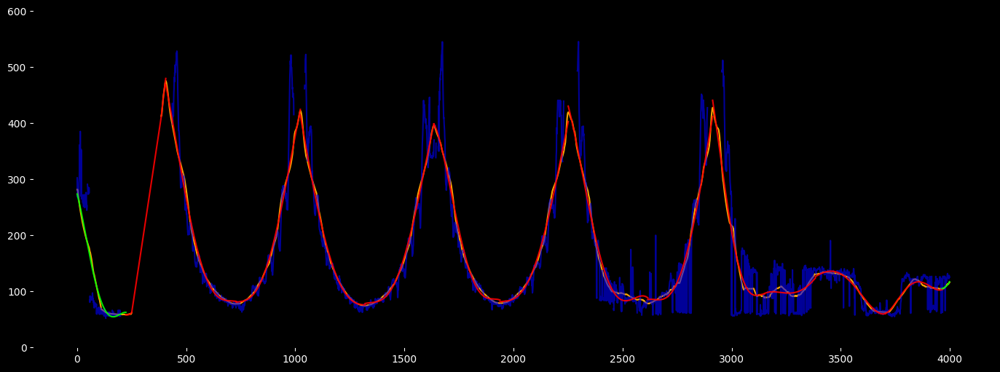

In [226]:
#@title Show code (algorithm 1)
fig, ax = plt.subplots(figsize=(17, 6))
pieces = sorted(np.concatenate((troughs, peaks)))

temp_ids = np.isfinite(df['frame_id']) & np.isfinite(movin)
indx = df.index[(df.index >= frames_of_interest[0]) & (df.index < frames_of_interest[-1]) & temp_ids]

vals = []
compare = []

ax.set_ylim(0, 600)
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]], movin[frames_of_interest[0]: frames_of_interest[-1]],
         color='orange', label='moving average')
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]], dists[frames_of_interest[0]: frames_of_interest[-1]],
         color='blue', label='data', alpha=0.6)


limright = (pieces[0] - leave_dist_to_peak) if pieces[0] in peaks else pieces[0]
limright = min(frames_of_interest[1], limright + interlace_distance_troughs) if pieces[0] in troughs else limright
try:
    curve = curve_fit(func4, df['frame_id'][indx].loc[0: limright], movin[indx].loc[0: limright], maxfev = 10000)[0]
    ax.plot(df['frame_id'][indx].loc[0: pieces[0]],
                func4(df['frame_id'][indx].loc[0: pieces[0]], curve[0], curve[1], curve[2], curve[3], curve[4]),
                label=f'interpolation', color='lime', alpha=0.9)
    vals.extend(func4(df['frame_id'][indx].loc[0: pieces[0]], curve[0], curve[1], curve[2], curve[3], curve[4]))
    compare.extend(dists[indx].loc[0: pieces[0]])
except ValueError:
    pass

for i in range(1, len(pieces)):
    limleft = (pieces[i - 1] + leave_dist_to_peak) if pieces[i - 1] in peaks else pieces[i - 1]
    limright = (pieces[i] - leave_dist_to_peak) if pieces[i] in peaks else pieces[i]
    limleft = max(frames_of_interest[0], limleft - interlace_distance_troughs) if pieces[i-1] in troughs else limleft
    limright = min(frames_of_interest[1], limright + interlace_distance_troughs) if pieces[i] in troughs else limright
    try:
        curve = curve_fit(func4, df['frame_id'][indx].loc[limleft: limright], movin[indx].loc[limleft: limright], maxfev = 10000)[0]
        ax.plot(df['frame_id'][indx].loc[pieces[i - 1]: pieces[i]],
                    func4(df['frame_id'][indx].loc[pieces[i - 1]: pieces[i]], curve[0], curve[1], curve[2], curve[3], curve[4]),
                    label=f'interpolation', color='red', alpha=0.9)
        vals.extend(func4(df['frame_id'][indx].loc[pieces[i - 1]: pieces[i]], curve[0], curve[1], curve[2], curve[3], curve[4]))
        compare.extend(dists[indx].loc[pieces[i - 1]: pieces[i]])
    except ValueError:
        pass

limleft = (pieces[-1] + leave_dist_to_peak) if pieces[-1] in peaks else pieces[-1]
limleft = max(frames_of_interest[0], limleft - interlace_distance_troughs) if pieces[i-1] in troughs else limleft
try:
    curve = curve_fit(func4, df['frame_id'][indx].loc[limleft: ], movin[indx].loc[limleft: ], maxfev = 10000)[0]
    ax.plot(df['frame_id'][indx].loc[pieces[-1]: ],
                func4(df['frame_id'][indx].loc[pieces[-1]: ], curve[0], curve[1], curve[2], curve[3], curve[4]),
                label=f'interpolation', color='lime', alpha=0.9)
    vals.extend(func4(df['frame_id'][indx].loc[pieces[-1]: ], curve[0], curve[1], curve[2], curve[3], curve[4]))
    compare.extend(dists[indx].loc[pieces[-1]: ])
except ValueError:
    pass

plt.show()

In [227]:
r2_score(np.array(compare)[np.isfinite(np.array(compare)) & np.isfinite(np.array(vals))], np.array(vals)[np.isfinite(np.array(compare)) & np.isfinite(np.array(vals))])

0.8542670119788092

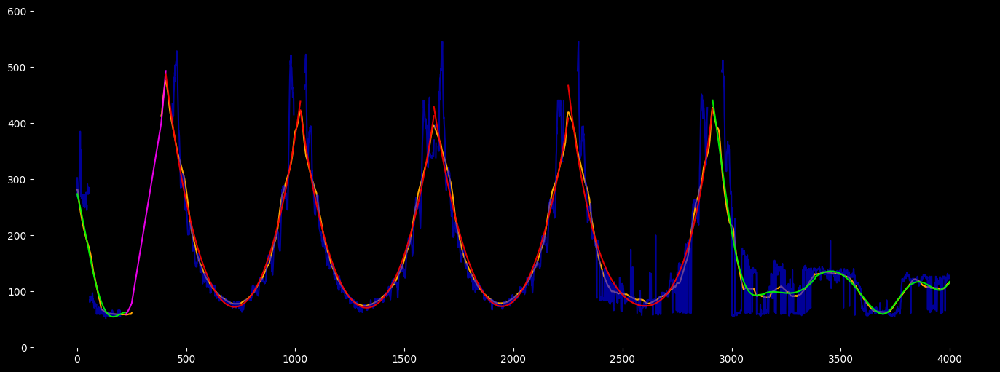

In [228]:
#@title Show code (algorithm 2)
fig, ax = plt.subplots(figsize=(17, 6))
pieces = sorted(np.concatenate((troughs, peaks)))

temp_ids = np.isfinite(df['frame_id']) & np.isfinite(movin)
indx = df.index[(df.index >= frames_of_interest[0]) & (df.index < frames_of_interest[-1]) & temp_ids]
vals = []
compare = []

ax.set_ylim(0, 600)
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]], movin[frames_of_interest[0]: frames_of_interest[-1]],
         color='orange', label='moving average')
ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]], dists[frames_of_interest[0]: frames_of_interest[-1]],
         color='blue', label='data', alpha=0.6)


try:
    limright = (pieces[0] - leave_dist_to_peak) if pieces[0] in peaks else min(frames_of_interest[1], pieces[0] + interlace_distance_troughs)
    curve = curve_fit(func4, df['frame_id'][indx].loc[0: limright], movin[indx].loc[0: limright], maxfev = 10000)[0]
    ax.plot(df['frame_id'][indx].loc[0: pieces[0]],
                func4(df['frame_id'][indx].loc[0: pieces[0]], curve[0], curve[1], curve[2], curve[3], curve[4]),
                label=f'interpolation', color='lime', alpha=0.9)
    vals.extend(func4(df['frame_id'][indx].loc[0: pieces[0]], curve[0], curve[1], curve[2], curve[3], curve[4]))
    compare.extend(dists[indx].loc[0: pieces[0]])
except ValueError:
    pass


i = 0
while (pieces[i] < peaks[0]):
    try:
        limleft = max(frames_of_interest[0], pieces[i] - interlace_distance_troughs) if pieces[i] in troughs else pieces[i]
        limright = min(frames_of_interest[1], pieces[i + 1] + interlace_distance_troughs) if pieces[i + 1] in troughs else pieces[i + 1]
        curve = curve_fit(func4, df['frame_id'][indx].loc[0: limright], movin[indx].loc[0: limright], maxfev = 10000)[0]
        ax.plot(df['frame_id'][indx].loc[pieces[i]: pieces[i + 1]],
                    func4(df['frame_id'][indx].loc[pieces[i]: pieces[i + 1]], curve[0], curve[1], curve[2], curve[3], curve[4]),
                    label=f'interpolation', color='magenta', alpha=0.9)
        vals.extend(func4(df['frame_id'][indx].loc[pieces[i]: pieces[i + 1]], curve[0], curve[1], curve[2], curve[3], curve[4]))
        compare.extend(dists[indx].loc[pieces[i]: pieces[i + 1]])
        i += 1
    except ValueError:
        pass

try:
    for i in range(1, len(peaks)):
        limleft = peaks[i - 1] + leave_dist_to_peak
        limright = peaks[i] - leave_dist_to_peak
        try:
            curve = curve_fit(func4, df['frame_id'][indx].loc[limleft: limright], movin[indx].loc[limleft: limright], maxfev = 10000)[0]
            ax.plot(df['frame_id'][indx].loc[peaks[i - 1]: peaks[i]],
                        func4(df['frame_id'][indx].loc[peaks[i - 1]: peaks[i]], curve[0], curve[1], curve[2], curve[3], curve[4]),
                        label=f'interpolation', color='red', alpha=0.9)
            vals.extend(func4(df['frame_id'][indx].loc[peaks[i - 1]: peaks[i]], curve[0], curve[1], curve[2], curve[3], curve[4]))
            compare.extend(dists[indx].loc[peaks[i - 1]: peaks[i]])
        except ValueError:
            pass
except:
    'Data is not clean'

i = pieces.index(peaks[-1]) + 1
while (i < len(pieces)):
    limleft = (pieces[i - 1] + leave_dist_to_peak) if pieces[i - 1] in peaks else min(frames_of_interest[1], pieces[i - 1] - interlace_distance_troughs)
    limright = max(frames_of_interest[0], pieces[i] + interlace_distance_troughs) if pieces[i] in troughs else pieces[i]
    try:
        curve = curve_fit(func4, df['frame_id'][indx].loc[limleft: limright], movin[indx].loc[limleft: limright], maxfev = 10000)[0]
        ax.plot(df['frame_id'][indx].loc[pieces[i - 1]: pieces[i]],
                    func4(df['frame_id'][indx].loc[pieces[i - 1]: pieces[i]], curve[0], curve[1], curve[2], curve[3], curve[4]),
                    label=f'interpolation', color='lime', alpha=0.9)
        vals.extend(func4(df['frame_id'][indx].loc[pieces[i - 1]: pieces[i]], curve[0], curve[1], curve[2], curve[3], curve[4]))
        compare.extend(dists[indx].loc[pieces[i - 1]: pieces[i]])
        i += 1
    except ValueError:
        pass


limleft = min(pieces[-1] + leave_dist_to_peak, frames_of_interest[-1]) if pieces[-1] in peaks else pieces[-1]
limleft = max(frames_of_interest[0], limleft - interlace_distance_troughs) if pieces[i-1] in troughs else limleft
try:
    curve = curve_fit(func4, df['frame_id'][indx].loc[limleft: ], movin[indx].loc[limleft: ], maxfev = 10000)[0]
    ax.plot(df['frame_id'][indx].loc[pieces[-1]: ],
                func4(df['frame_id'][indx].loc[pieces[-1]: ], curve[0], curve[1], curve[2], curve[3], curve[4]),
                label=f'interpolation', color='lime', alpha=0.9)
    vals.extend(func4(df['frame_id'][indx].loc[pieces[-1]: ], curve[0], curve[1], curve[2], curve[3], curve[4]))
    compare.extend(dists[indx].loc[pieces[-1]: ])
except ValueError:
    pass

plt.show()

In [229]:
r2_score(np.array(compare)[np.isfinite(np.array(compare)) & np.isfinite(np.array(vals))], np.array(vals)[np.isfinite(np.array(compare)) & np.isfinite(np.array(vals))])

0.8434251823405273

<h3> Another approach </h3>
Divide by distance between some two points

Again, for reference <br>
<img src="https://raw.githubusercontent.com/oscar-foxtrot/Coxarthrosis-research/main/images/hips_03.png">

In [230]:
dist_to_divide = (1, 0)
dist_points = ((2, 3), (1, 2), (3, 4)) # SET MANUALLY
frames_of_interest = (0, 4000)

offset_df_columns = 9

p0 = dist_to_divide[0]
p1 = dist_to_divide[1]
p0 = f'0{p0 + offset_df_columns}' if p0 + offset_df_columns < 10 else f'{p0 + offset_df_columns}'
p1 = f'0{p1 + offset_df_columns}' if p1 + offset_df_columns < 10 else f'{p1 + offset_df_columns}'
divider = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
        + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)

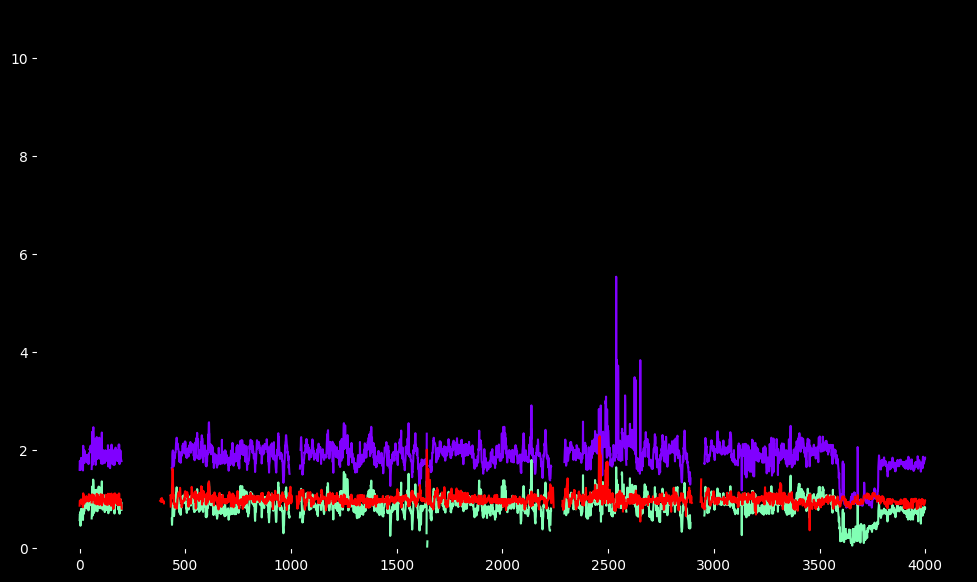

In [231]:
fig, ax = plt.subplots(figsize=(12, 7))
colors = mpl.cm.rainbow(np.linspace(0, 1, len(dist_points)))

ax.set_ylim(0, 11)
i = 0
for elem in dist_points:
    p0 = elem[0]
    p1 = elem[1]
    p0 = f'0{p0 + offset_df_columns}' if p0 + offset_df_columns < 10 else f'{p0 + offset_df_columns}'
    p1 = f'0{p1 + offset_df_columns}' if p1 + offset_df_columns < 10 else f'{p1 + offset_df_columns}'
    dists = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
            + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2) / divider

    ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]],
            dists[frames_of_interest[0]: frames_of_interest[-1]],
            color=colors[i])
    i += 1
plt.show()

(3, 4) and (0, 1) make the best plots <br>
Idea: divide by the average

In [232]:
dist_to_divide = ((1, 0), (3, 4))
dist_points = ((2, 3), (1, 2), (3, 4)) # SET MANUALLY
frames_of_interest = (1000, 2000)

offset_df_columns = 9

divider = 0
for elem in dist_to_divide:
    p0 = elem[0]
    p1 = elem[1]
    p0 = f'0{p0 + offset_df_columns}' if p0 + offset_df_columns < 10 else f'{p0 + offset_df_columns}'
    p1 = f'0{p1 + offset_df_columns}' if p1 + offset_df_columns < 10 else f'{p1 + offset_df_columns}'
    divider += np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
            + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)
divider /= len(dist_to_divide)

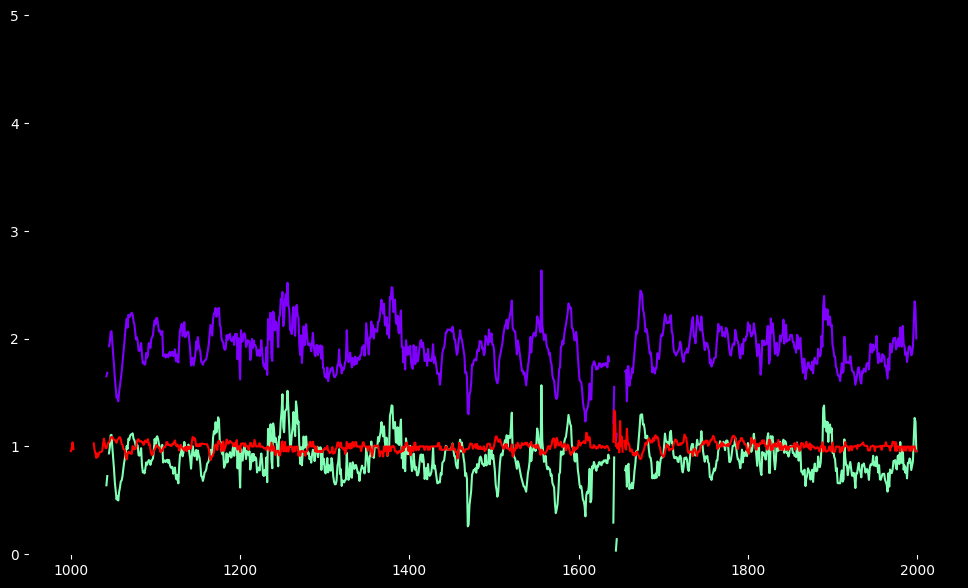

In [233]:
fig, ax = plt.subplots(figsize=(12, 7))
colors = mpl.cm.rainbow(np.linspace(0, 1, len(dist_points)))

ax.set_ylim(0, 5)
i = 0
for elem in dist_points:
    p0 = elem[0]
    p1 = elem[1]
    p0 = f'0{p0 + offset_df_columns}' if p0 + offset_df_columns < 10 else f'{p0 + offset_df_columns}'
    p1 = f'0{p1 + offset_df_columns}' if p1 + offset_df_columns < 10 else f'{p1 + offset_df_columns}'
    dists = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
            + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2) / divider

    ax.plot(df["frame_id"][frames_of_interest[0]: frames_of_interest[-1]],
            dists[frames_of_interest[0]: frames_of_interest[-1]],
            color=colors[i])
    i += 1
plt.show()